# Melanoma Detection using Deep Learning

## Overview

This notebook implements a binary classification system to distinguish between benign and malignant melanocytic skin lesions using convolutional neural networks (CNNs) and transfer learning.

## Objectives

- Build a high-recall classifier to minimize missed melanoma cases
- Leverage transfer learning with EfficientNet-B3 pre-trained on ImageNet
- Apply medical image preprocessing techniques (hair removal, contrast enhancement)
- Evaluate model performance with clinical metrics (recall, precision, AUC)

## Dataset

- **Source**: HAM10000 melanocytic lesion subset
- **Classes**: Benign vs. Malignant
- **Training**: 8,868 images
- **Testing**: 2,247 images

## Methodology

1. **Preprocessing**: Hair removal, CLAHE contrast enhancement, conservative augmentation
2. **Architecture**: EfficientNet-B3 with custom classifier head
3. **Training**: Progressive unfreezing, focal loss with class weighting
4. **Evaluation**: Confusion matrices, ROC curves, confidence-based thresholding

## Disclaimer

This is a research project for educational purposes only. Not intended for clinical diagnosis.

# Import Libraries

In [ ]:
# Core libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import random
from tqdm.auto import tqdm
import warnings
warnings.filterwarnings('ignore')

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torchvision
from torchvision import datasets, models, transforms
from torchvision.models import resnet50, ResNet50_Weights
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from torchvision.models import efficientnet_b3, EfficientNet_B3_Weights

# Image processing
from PIL import Image
import cv2

# Metrics and evaluation
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report, roc_curve, auc, roc_auc_score
)

# Set style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette('husl')

print(f'PyTorch version: {torch.__version__}')
print(f'Torchvision version: {torchvision.__version__}')
print(f'CUDA available: {torch.cuda.is_available()}')
if torch.cuda.is_available():
    print(f'CUDA device: {torch.cuda.get_device_name(0)}')


import sys

# Add current directory to path
sys.path.append(os.path.dirname(os.path.abspath('.')))

try:
    # Import from MINIMAL module (the new one)
    from medical_preprocessing_minimal import (
        get_medical_train_transforms_flips_only,
        get_medical_test_transforms
    )
    
    # Import base classes for visualization from original module
    from medical_preprocessing import (
        visualize_preprocessing_steps,
    )
    
except ImportError as e:
    print(f"❌ Error loading medical_preprocessing modules: {e}")
    print("\nMake sure both files are in the same directory as your notebook:")
    print("  - medical_preprocessing.py")
    print("  - medical_preprocessing_minimal.py")
    raise

PyTorch version: 2.10.0.dev20251016+cu128
Torchvision version: 0.25.0.dev20251016+cu128
CUDA available: True
CUDA device: NVIDIA GeForce RTX 5070
✅ Medical preprocessing modules loaded successfully!
   → Using MINIMAL module for training (flips only)
   → Using original module for visualization


## Device Configuration and Reproducibility

Setting random seeds ensures experiments can be replicated.

In [2]:
# Set random seeds for reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')

if device.type == 'cuda':
    print(f'GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB')

Using device: cuda
GPU Memory: 12.82 GB


## Dataset Configuration

In [3]:
# Define data directories
TRAIN_DIR = 'HAM10000_binary/train'
TEST_DIR = 'HAM10000_binary/test'

# Hyperparameters
BATCH_SIZE = 64
NUM_EPOCHS = 50
LEARNING_RATE = 0.001
IMG_SIZE = 224  # Standard size for ImageNet pre-trained models
NUM_WORKERS = 4  # For data loading

# Class names
CLASS_NAMES = ['benign', 'malignant']

print(f'Train directory: {TRAIN_DIR}')
print(f'Test directory: {TEST_DIR}')
print(f'Image size: {IMG_SIZE}x{IMG_SIZE}')
print(f'Batch size: {BATCH_SIZE}')
print(f'Number of epochs: {NUM_EPOCHS}')

Train directory: HAM10000_binary/train
Test directory: HAM10000_binary/test
Image size: 224x224
Batch size: 64
Number of epochs: 50


## Exploratory Data Analysis (EDA)

=== Training Set ===
benign: 6710 images
malignant: 1302 images
Total: 8012 images

=== Test Set ===
benign: 1678 images
malignant: 325 images
Total: 2003 images


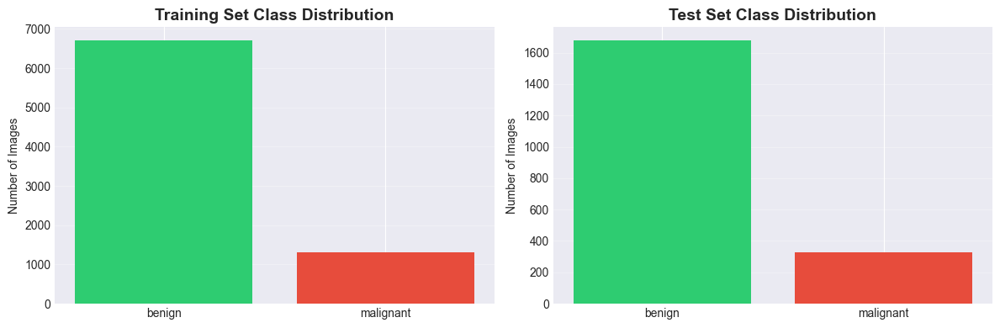

In [4]:
def count_images(directory):
    """Count images in each class."""
    counts = {}
    for class_name in CLASS_NAMES:
        class_dir = os.path.join(directory, class_name)
        if os.path.exists(class_dir):
            counts[class_name] = len([f for f in os.listdir(class_dir) 
                                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
    return counts

# Count images
train_counts = count_images(TRAIN_DIR)
test_counts = count_images(TEST_DIR)

print('=== Training Set ===')
for class_name, count in train_counts.items():
    print(f'{class_name}: {count} images')
print(f'Total: {sum(train_counts.values())} images')

print('\n=== Test Set ===')
for class_name, count in test_counts.items():
    print(f'{class_name}: {count} images')
print(f'Total: {sum(test_counts.values())} images')

# Visualize class distribution
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Training set
axes[0].bar(train_counts.keys(), train_counts.values(), color=['#2ecc71', '#e74c3c'])
axes[0].set_title('Training Set Class Distribution', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Number of Images')
axes[0].grid(axis='y', alpha=0.3)

# Test set
axes[1].bar(test_counts.keys(), test_counts.values(), color=['#2ecc71', '#e74c3c'])
axes[1].set_title('Test Set Class Distribution', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Number of Images')
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

## Visualize Sample Images

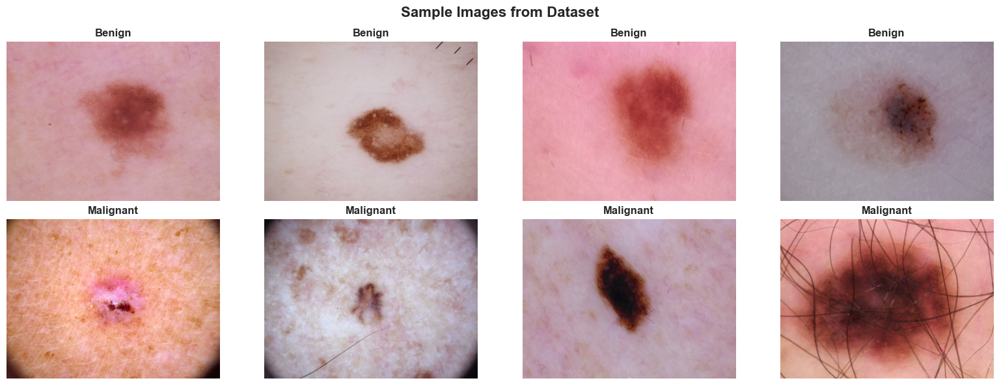

In [5]:
def display_sample_images(directory, num_samples=8):
    """Display sample images from each class."""
    fig, axes = plt.subplots(2, num_samples//2, figsize=(16, 6))
    fig.suptitle('Sample Images from Dataset', fontsize=16, fontweight='bold')
    
    for idx, class_name in enumerate(CLASS_NAMES):
        class_dir = os.path.join(directory, class_name)
        image_files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        samples = random.sample(image_files, min(num_samples//2, len(image_files)))
        
        for i, img_file in enumerate(samples):
            img_path = os.path.join(class_dir, img_file)
            img = Image.open(img_path)
            
            axes[idx, i].imshow(img)
            axes[idx, i].set_title(f'{class_name.capitalize()}', fontweight='bold')
            axes[idx, i].axis('off')
    
    plt.tight_layout()
    plt.show()

display_sample_images(TRAIN_DIR)

## Data Preprocessing and Augmentation

In [ ]:
# IMAGENET normalization constants
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

# Create transforms with LESION CROPPING ENABLED
train_transforms = get_medical_train_transforms_flips_only(
    img_size=224,
    enable_hair_removal=True,
    enable_lesion_crop=False,      
    enable_contrast=True
)

test_transforms = get_medical_test_transforms(
    img_size=224,
    enable_hair_removal=True,
    enable_lesion_crop=False,      
    enable_contrast=True
)


🔍 VISUALIZING PREPROCESSING STEPS

BENIGN sample: ISIC_0033159.jpg


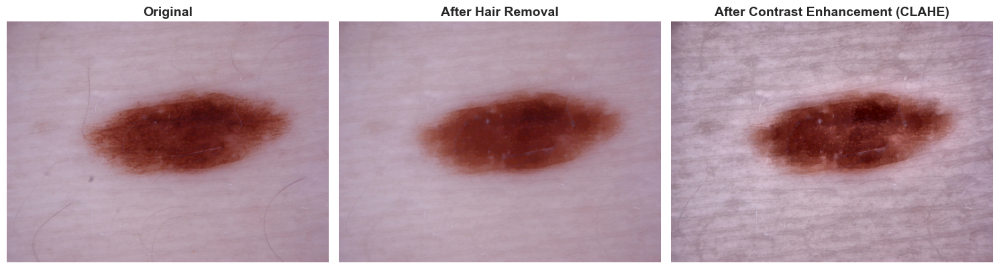


MALIGNANT sample: ISIC_0026239.jpg


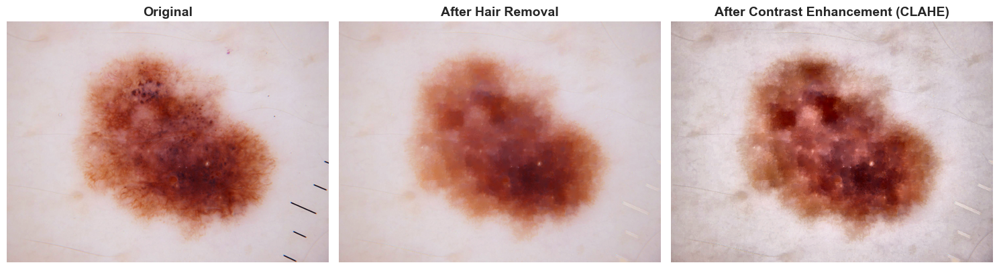

In [7]:
print("\n" + "="*80)
print("🔍 VISUALIZING PREPROCESSING STEPS")
print("="*80)

import random
from pathlib import Path

# Get random sample images from each class
for class_name in CLASS_NAMES:
    class_dir = Path(TRAIN_DIR) / class_name
    image_files = list(class_dir.glob('*.jpg')) + list(class_dir.glob('*.png'))
    
    if image_files:
        sample_path = random.choice(image_files)
        print(f"\n{class_name.upper()} sample: {sample_path.name}")
        visualize_preprocessing_steps(
            str(sample_path), 
        )


## Create Data Loaders

In [8]:
# Create datasets
train_dataset = datasets.ImageFolder(root=TRAIN_DIR, transform=train_transforms)
test_dataset = datasets.ImageFolder(root=TEST_DIR, transform=test_transforms)

# Create data loaders
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True if torch.cuda.is_available() else False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True if torch.cuda.is_available() else False
)

# Get class to index mapping
class_to_idx = train_dataset.class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}

print(f'✓ DataLoaders created')
print(f'  Training batches: {len(train_loader)}')
print(f'  Testing batches: {len(test_loader)}')
print(f'  Class mapping: {class_to_idx}')

✓ DataLoaders created
  Training batches: 126
  Testing batches: 32
  Class mapping: {'benign': 0, 'malignant': 1}


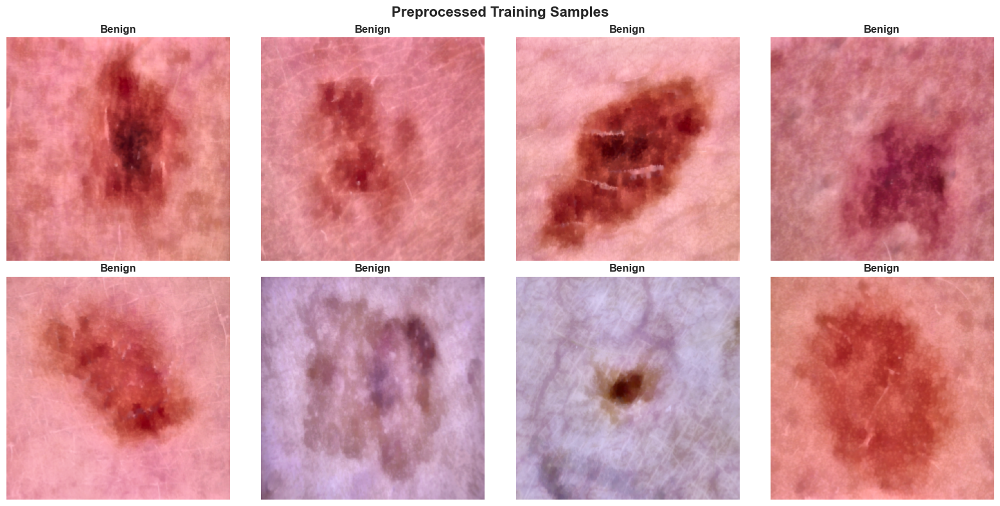

✓ All samples show medical preprocessing + augmentation applied


In [9]:
# Enhanced visualization - Multiple samples
import numpy as np

IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
IMAGENET_STD = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

def denormalize(tensor):
    """Denormalize a tensor for visualization."""
    img = tensor * IMAGENET_STD + IMAGENET_MEAN
    img = img.permute(1, 2, 0).numpy()
    return np.clip(img, 0, 1)

# Show 8 samples (4 benign, 4 malignant)
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle('Preprocessed Training Samples', fontsize=16, fontweight='bold')

for idx in range(8):
    img_tensor, label = train_dataset[idx]
    img_display = denormalize(img_tensor)
    
    row = idx // 4
    col = idx % 4
    
    axes[row, col].imshow(img_display)
    axes[row, col].set_title(f'{CLASS_NAMES[label].capitalize()}', 
                              fontweight='bold', fontsize=12)
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

print("✓ All samples show medical preprocessing + augmentation applied")

## Model Architecture - Transfer Learning

In [ ]:
import torch
import torch.nn as nn
from torchvision.models import efficientnet_b3, EfficientNet_B3_Weights


class SimpleEfficientNet(nn.Module):
    """
    Simple EfficientNet-B3 baseline classifier.
    
    Architecture:
    - EfficientNet-B3 pre-trained backbone
    - 3-layer MLP classifier with BatchNorm
    - Progressive dropout (0.5 → 0.4 → 0.3)
    """
    def __init__(self, num_classes=2, pretrained=True):
        super(SimpleEfficientNet, self).__init__()
        
        # Load pre-trained EfficientNet-B3
        if pretrained:
            weights = EfficientNet_B3_Weights.DEFAULT
            base_model = efficientnet_b3(weights=weights)
        else:
            base_model = efficientnet_b3(weights=None)
        
        # Extract feature extractor (all layers except classifier)
        self.features = base_model.features
        
        # EfficientNet-B3 outputs 1536 features
        self.avgpool = nn.AdaptiveAvgPool2d(1)
        
        # Simple 3-layer classifier with BatchNorm
        self.classifier = nn.Sequential(
            nn.Dropout(0.5),
            nn.Linear(1536, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(inplace=True),
            nn.Dropout(0.4),
            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )
        
    def forward(self, x):
        # Extract features
        x = self.features(x)
        
        # Global average pooling
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        
        # Classification
        x = self.classifier(x)
        
        return x
    
    def freeze_backbone(self):
        """Freeze all feature extraction layers."""
        for param in self.features.parameters():
            param.requires_grad = False
    
    def unfreeze_last_n_blocks(self, n):
        """
        Unfreeze last n blocks for progressive training.
        
        Args:
            n: Number of blocks to unfreeze
               -1 = unfreeze all
               0 = keep all frozen
               1-9 = unfreeze last n blocks
        """
        if n == 0:
            return  # Already frozen
        elif n == -1:
            # Unfreeze everything
            for param in self.features.parameters():
                param.requires_grad = True
            print(f"✓ All feature layers unfrozen")
        else:
            # Unfreeze last n blocks
            all_blocks = list(self.features.children())
            for block in all_blocks[-n:]:
                for param in block.parameters():
                    param.requires_grad = True
            print(f"✓ Unfroze last {n} blocks")


# ============================================================
# CREATE SIMPLE MODEL 
# ============================================================

print("="*80)
print("CREATING SIMPLE EFFICIENTNET-B3 (BEST PERFORMING MODEL)")
print("="*80)

# Create simple model
model = SimpleEfficientNet(num_classes=2, pretrained=True)

# Initially freeze backbone (only train classifier)
model.freeze_backbone()

# Move to device
model = model.to(device)

# Count parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
frozen_params = total_params - trainable_params

print(f'\n✓ Simple Model Created')
print(f'  Architecture: EfficientNet-B3 + 3-Layer MLP')
print(f'  Total parameters: {total_params:,}')
print(f'  Trainable parameters: {trainable_params:,}')
print(f'  Frozen parameters: {frozen_params:,}')
print("="*80)

CREATING SIMPLE EFFICIENTNET-B3 (BEST PERFORMING MODEL)

✓ Simple Model Created
  Architecture: EfficientNet-B3 + 3-Layer MLP
  Total parameters: 12,799,018
  Trainable parameters: 2,102,786
  Frozen parameters: 10,696,232


## GPU Compatibility (RTX 5070 and Newer GPUs)

In [11]:
# GPU Compatibility Fix for newer architectures
import os
import warnings

# Suppress compute capability warnings for newer GPUs
warnings.filterwarnings('ignore', category=UserWarning, message='.*CUDA capability.*')

# Enable compatibility mode
os.environ['PYTORCH_CUDA_ALLOC_CONF'] = 'expandable_segments:True'

if torch.cuda.is_available():
    compute_cap = torch.cuda.get_device_capability(0)
    print(f'GPU Compute Capability: {compute_cap[0]}.{compute_cap[1]}')
    if compute_cap[0] >= 12:
        print('✓ Newer GPU detected - compatibility mode enabled')
    else:
        print('✓ GPU fully supported')
else:
    print('Using CPU mode')

GPU Compute Capability: 12.0
✓ Newer GPU detected - compatibility mode enabled


In [ ]:
# Calculate class weights for imbalanced data
def calculate_class_weights(train_loader):
    """Calculate class weights inversely proportional to class frequencies."""
    class_counts = torch.zeros(2)
    for _, labels in train_loader:
        for label in labels:
            class_counts[label] += 1
    
    # Inverse frequency weighting
    class_weights = 1.0 / class_counts
    class_weights = class_weights / class_weights.sum() * 2  # Normalize
    return class_weights


class FocalLoss(nn.Module):
    """
    Standard Focal Loss - balanced approach.
    
    Formula: FL = -α(1-p)^γ * log(p)
    - γ=2.0: Focuses on hard examples (proven in literature)
    - α: Class weights (handles imbalance)
    """
    def __init__(self, alpha=None, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
        
    def forward(self, inputs, targets):
        ce_loss = nn.functional.cross_entropy(
            inputs, targets, reduction='none', weight=self.alpha
        )
        p = torch.exp(-ce_loss)
        focal_loss = (1 - p) ** self.gamma * ce_loss
        
        if self.reduction == 'mean':
            return focal_loss.mean()
        return focal_loss


# Get class weights 
class_weights = calculate_class_weights(train_loader)
print("="*80)
print("STANDARD FOCAL LOSS (PROVEN APPROACH)")
print("="*80)
print(f'Class weights: benign={class_weights[0]:.4f}, malignant={class_weights[1]:.4f}')
class_weights = class_weights.to(device)

# Create standard Focal Loss criterion
criterion = FocalLoss(alpha=class_weights, gamma=2.0)

print('\n✓ Standard Focal Loss configured (gamma=2.0)')
print('  - Same gamma for both classes (proven in Lin et al. 2017)')
print('  - Class weights handle imbalance')
print('  - Better balance between confidence and accuracy')
print("="*80)


STANDARD FOCAL LOSS (PROVEN APPROACH)
Class weights: benign=0.3250, malignant=1.6750

✓ Standard Focal Loss configured (gamma=2.0)
  - Same gamma for both classes (proven in Lin et al. 2017)
  - Class weights handle imbalance
  - Better balance between confidence and accuracy


## Training Loop

In [13]:
def train_one_epoch(model, train_loader, criterion, optimizer, device, max_grad_norm=1.0):
    """
    Train for one epoch with gradient clipping.
    
    Args:
        max_grad_norm: Maximum gradient norm for clipping (prevents instability)
    """
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    pbar = tqdm(train_loader, desc='Training', leave=False)
    for images, labels in pbar:
        images, labels = images.to(device), labels.to(device)
        
        # Zero gradients
        optimizer.zero_grad()
        
        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)
        
        # Backward pass
        loss.backward()
        
        # Gradient clipping (IMPORTANT: prevents training instability)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
        
        # Optimizer step
        optimizer.step()
        
        # Statistics
        running_loss += loss.item() * images.size(0)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        
        # Update progress bar
        pbar.set_postfix({'loss': loss.item(), 'acc': 100. * correct / total})
    
    epoch_loss = running_loss / total
    epoch_acc = 100. * correct / total
    return epoch_loss, epoch_acc

def validate(model, test_loader, criterion, device):
    """Validate the model."""
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    
    all_preds = []
    all_labels = []
    all_probs = []
    
    with torch.no_grad():
        pbar = tqdm(test_loader, desc='Validation', leave=False)
        for images, labels in pbar:
            images, labels = images.to(device), labels.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            # Get probabilities
            probs = torch.softmax(outputs, dim=1)
            
            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
            # Store predictions
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs[:, 1].cpu().numpy())  # Probability of malignant
    
    epoch_loss = running_loss / total
    epoch_acc = 100. * correct / total
    return epoch_loss, epoch_acc, all_preds, all_labels, all_probs

print('✓ Training functions defined (with gradient clipping)')


✓ Training functions defined (with gradient clipping)


In [ ]:
def train_progressive(model, train_loader, test_loader, criterion, device):
    """
    IMPROVED Three-phase progressive unfreezing with better hyperparameters.
    
    IMPROVEMENTS FROM BASELINE:
    - Lower learning rates (0.0005 -> 0.00005) for stability
    - AdamW optimizer with weight decay for regularization
    - CosineAnnealingWarmRestarts scheduler
    - Extended training (50 epochs total)
    - Gradient clipping in train_one_epoch
    - Better unfreezing schedule
    
    Phase 1 (10 epochs): Train classifier only - warmup
    Phase 2 (15 epochs): Unfreeze last 3 blocks  
    Phase 3 (25 epochs): Unfreeze all layers - full fine-tuning
    
    MODEL SELECTION: Uses validation AUC 
    
    """
    
    history = {
        'train_loss': [], 'train_acc': [],
        'val_loss': [], 'val_acc': [], 'val_auc': []
    }
    
    best_val_auc = 0.0
    best_model_path = 'best_melanoma_improved.pth'
    patience = 15  # Early stopping patience
    no_improve = 0
    
    # ========== PHASE 1: CLASSIFIER ONLY (WARMUP) ==========
    print("\n" + "="*80)
    print("PHASE 1: Training Classifier (Backbone Frozen) - 10 Epochs")
    print("="*80)
    
    # IMPROVED: Lower LR, AdamW, weight decay
    optimizer = optim.AdamW(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=0.0005,  # Reduced from 0.001
        weight_decay=0.01,  # Added for regularization
        betas=(0.9, 0.999)
    )
    
    # IMPROVED: CosineAnnealingWarmRestarts
    scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(
        optimizer, T_0=10, T_mult=2, eta_min=1e-7
    )
    
    phase1_best_auc = 0.0
    
    for epoch in range(10):
        # Train with gradient clipping
        train_loss, train_acc = train_one_epoch(
            model, train_loader, criterion, optimizer, device, max_grad_norm=1.0
        )
        
        # Validate and calculate AUC
        val_loss, val_acc, _, val_labels, val_probs = validate(
            model, test_loader, criterion, device
        )
        
        # Calculate AUC-ROC
        val_auc = roc_auc_score(val_labels, val_probs)
        
        scheduler.step()
        
        # Store
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        history['val_auc'].append(val_auc)
        
        # Save best model based on AUC
        if val_auc > best_val_auc:
            best_val_auc = val_auc
            phase1_best_auc = val_auc
            no_improve = 0
            torch.save({
                'model_state_dict': model.state_dict(),
                'val_auc': val_auc,
                'val_acc': val_acc,
                'epoch': epoch + 1
            }, best_model_path)
        else:
            no_improve += 1
    
    print(f"✓ Phase 1 Complete - Best AUC: {phase1_best_auc:.4f}")
    
    # ========== PHASE 2: PARTIAL UNFREEZING ==========
    print("\n" + "="*80)
    print("PHASE 2: Unfreezing Last 3 Blocks - 15 Epochs")
    print("="*80)
    
    model.unfreeze_last_n_blocks(3)  # Unfreeze last 3
    
    # IMPROVED: Lower learning rates for backbone
    optimizer = optim.AdamW([
        {'params': model.classifier.parameters(), 'lr': 0.0005},      # Same as Phase 1
        {'params': model.features[-3:].parameters(), 'lr': 0.00005}   # 10x lower
    ], weight_decay=0.01, betas=(0.9, 0.999))
    
    scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(
        optimizer, T_0=10, T_mult=2, eta_min=1e-7
    )
    
    phase2_best_auc = 0.0
    
    for epoch in range(15):
        train_loss, train_acc = train_one_epoch(
            model, train_loader, criterion, optimizer, device, max_grad_norm=1.0
        )
        val_loss, val_acc, _, val_labels, val_probs = validate(
            model, test_loader, criterion, device
        )
        
        val_auc = roc_auc_score(val_labels, val_probs)
        scheduler.step()
        
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        history['val_auc'].append(val_auc)
        
        if val_auc > best_val_auc:
            best_val_auc = val_auc
            phase2_best_auc = val_auc
            no_improve = 0
            torch.save({
                'model_state_dict': model.state_dict(),
                'val_auc': val_auc,
                'val_acc': val_acc,
                'epoch': 10 + epoch + 1
            }, best_model_path)
        else:
            no_improve += 1
        
        # Early stopping check
        if no_improve >= patience:
            print(f'Early stopping: No improvement for {patience} epochs')
            break
    
    print(f"✓ Phase 2 Complete - Best AUC: {phase2_best_auc:.4f}")
    
    # ========== PHASE 3: FULL FINE-TUNING ==========
    print("\n" + "="*80)
    print("PHASE 3: Full Fine-Tuning (All Layers) - 25 Epochs")
    print("="*80)
    
    model.unfreeze_last_n_blocks(-1)  # Unfreeze all
    
    # IMPROVED: Discriminative learning rates (lower than before)
    blocks = list(model.features.children())
    n = len(blocks)
    
    def get_params(block_list):
        """Collect all parameters from a list of blocks."""
        params = []
        for block in block_list:
            params.extend(block.parameters())
        return params
    
    optimizer = optim.AdamW([
        {'params': get_params(blocks[:n//3]), 'lr': 0.00001},           # Early layers (lowest)
        {'params': get_params(blocks[n//3:2*n//3]), 'lr': 0.00003},     # Middle layers
        {'params': get_params(blocks[2*n//3:]), 'lr': 0.00005},         # Late layers
        {'params': model.classifier.parameters(), 'lr': 0.0005}         # Classifier (highest)
    ], weight_decay=0.01, betas=(0.9, 0.999))
    
    scheduler = optim.lr_scheduler.CosineAnnealingWarmRestarts(
        optimizer, T_0=10, T_mult=2, eta_min=1e-7
    )
    
    phase3_best_auc = 0.0
    
    for epoch in range(25):
        train_loss, train_acc = train_one_epoch(
            model, train_loader, criterion, optimizer, device, max_grad_norm=1.0
        )
        val_loss, val_acc, _, val_labels, val_probs = validate(
            model, test_loader, criterion, device
        )
        
        val_auc = roc_auc_score(val_labels, val_probs)
        scheduler.step()
        
        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)
        history['val_auc'].append(val_auc)
        
        if val_auc > best_val_auc:
            best_val_auc = val_auc
            phase3_best_auc = val_auc
            no_improve = 0
            torch.save({
                'model_state_dict': model.state_dict(),
                'val_auc': val_auc,
                'val_acc': val_acc,
                'epoch': 25 + epoch + 1
            }, best_model_path)
        else:
            no_improve += 1
        
        # Early stopping check
        if no_improve >= patience:
            print(f'Early stopping: No improvement for {patience} epochs')
            break
    
    print(f"✓ Phase 3 Complete - Best AUC: {phase3_best_auc:.4f}")
    
    print("\n" + "="*80)
    print(f"TRAINING COMPLETE - Best Overall AUC: {best_val_auc:.4f}")
    print(f"Model saved to: {best_model_path}")
    print("="*80)
    
    return model, history

print('✓ Progressive training function defined')


✓ Progressive training function defined


In [15]:
# ============================================================
# ENSEMBLE TRAINING: Train 3 Models with Different Seeds
# ============================================================

import torch
import numpy as np
import random
import time
from pathlib import Path

# Create directory for ensemble models
Path('ensemble_models').mkdir(exist_ok=True)

# Seeds for reproducibility and diversity
# SEEDS = [42, 123, 456]  # 3 different seeds
SEEDS = [42, 123]  # 2 different seeds

print("="*80)
print("ENSEMBLE TRAINING: 3 Models with Different Seeds")
print("="*80)
print(f"Seeds: {SEEDS}")
print(f"Expected total time: ~9 hours (3 hours per model)")
print("="*80)

# Store all trained models
ensemble_models = []
ensemble_histories = []

# Track best single model across ensemble
best_single_auc = 0.0
best_single_model = None
best_single_seed = None

# Train each model
for i, seed in enumerate(SEEDS):
    print("\n" + "="*80)
    print(f"TRAINING MODEL {i+1}/3 (Seed: {seed})")
    print("="*80)
    
    # Set all random seeds for reproducibility
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    
    # Optional: Make training deterministic (slower but reproducible)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
    # Create fresh model (same architecture as Model 4)
    model = SimpleEfficientNet(num_classes=2, pretrained=True)
    model.freeze_backbone()
    model = model.to(device)
    
    print(f"\n✓ Model {i+1} created with seed {seed}")
    print(f"  Architecture: Simple EfficientNet-B3")
    print(f"  Parameters: {sum(p.numel() for p in model.parameters()):,}")
    
    # Train the model (using your existing train_progressive function)
    start_time = time.time()
    
    trained_model, history = train_progressive(
        model=model,
        train_loader=train_loader,
        test_loader=test_loader,
        criterion=criterion,
        device=device
    )
    
    training_time = (time.time() - start_time) / 3600  # Convert to hours
    
    # FIXED: Use best_val_auc from history instead of last epoch
    best_auc = history.get('best_val_auc', history['val_auc'][-1])
    best_epoch = history.get('best_epoch', len(history['val_auc']) - 1)
    
    # Save model
    model_path = f'ensemble_models/model_seed_{seed}.pth'
    torch.save({
        'model_state_dict': trained_model.state_dict(),
        'seed': seed,
        'history': history,
        'training_time': training_time,
        'best_val_auc': best_auc,
        'best_epoch': best_epoch
    }, model_path)
    
    print(f"\n✓ Model {i+1} training complete!")
    print(f"  Time: {training_time:.2f} hours")
    print(f"  Best AUC: {best_auc:.4f} (epoch {best_epoch})")  # FIXED: Show best AUC
    print(f"  Last epoch AUC: {history['val_auc'][-1]:.4f}")   # Also show last for comparison
    print(f"  Saved to: {model_path}")
    
    # Store model and history
    ensemble_models.append(trained_model)
    ensemble_histories.append(history)
    
    # Compare to best single model (starting from model 2)
    if i >= 1:  # Starting from the second model
        if best_auc > best_single_auc:
            prev_best = best_single_auc  # Store BEFORE updating
            
            best_single_auc = best_auc
            best_single_model = trained_model
            best_single_seed = seed
            
            # Save as best single model
            best_single_path = 'best_melanoma_single.pth'
            torch.save({
                'model_state_dict': trained_model.state_dict(),
                'seed': seed,
                'history': history,
                'training_time': training_time,
                'best_val_auc': best_auc,
                'best_epoch': best_epoch,
                'model_number': i + 1
            }, best_single_path)
            
            print(f"\nNEW BEST SINGLE MODEL!")
            print(f"  Model {i+1} (seed {seed}) outperforms previous best")
            print(f"  New AUC: {best_auc:.4f} > Previous: {prev_best:.4f}")
            print(f"  Saved to: {best_single_path}")
        else:
            print(f"\n  Current best single model: Model with seed {best_single_seed} (AUC: {best_single_auc:.4f})")
            print(f"  This model: {best_auc:.4f} (not better)")
    else:
        # First model is automatically the best so far
        best_single_auc = best_auc
        best_single_model = trained_model
        best_single_seed = seed
        
        # Save first model as initial best
        best_single_path = 'best_melanoma_single.pth'
        torch.save({
            'model_state_dict': trained_model.state_dict(),
            'seed': seed,
            'history': history,
            'training_time': training_time,
            'best_val_auc': best_auc,
            'best_epoch': best_epoch,
            'model_number': i + 1
        }, best_single_path)
        print(f"\n  Set as initial best single model (AUC: {best_auc:.4f})")
    
    print("="*80)

# ============================================================
# ENSEMBLE TRAINING SUMMARY
# ============================================================

print("\n" + "="*80)
print("ENSEMBLE TRAINING COMPLETE")
print("="*80)

print(f"\nIndividual Model Performance:")
for i, (seed, history) in enumerate(zip(SEEDS, ensemble_histories)):
    # FIXED: Use best_val_auc instead of last epoch
    best_auc = history.get('best_val_auc', history['val_auc'][-1])
    last_auc = history['val_auc'][-1]
    best_epoch = history.get('best_epoch', 'unknown')
    
    print(f"  Model {i+1} (seed {seed}):")
    print(f"    Best AUC: {best_auc:.4f} (saved at epoch {best_epoch})")
    print(f"    Last AUC: {last_auc:.4f}")

# Calculate average using best AUCs
avg_best_auc = np.mean([h.get('best_val_auc', h['val_auc'][-1]) for h in ensemble_histories])
print(f"\n  Average Best AUC: {avg_best_auc:.4f}")

print(f"\nBest Single Model:")
print(f"  Seed: {best_single_seed}")
print(f"  AUC: {best_single_auc:.4f}")
print(f"  Saved to: best_melanoma_single.pth")

print(f"\nAll ensemble models saved in: ensemble_models/")
print(f"Models stored in memory: {len(ensemble_models)} models")
print("\nNext: Evaluate ensemble predictions on test set")
print("="*80)


ENSEMBLE TRAINING: 3 Models with Different Seeds
Seeds: [42, 123]
Expected total time: ~9 hours (3 hours per model)

TRAINING MODEL 1/3 (Seed: 42)

✓ Model 1 created with seed 42
  Architecture: Simple EfficientNet-B3
  Parameters: 12,799,018

PHASE 1: Training Classifier (Backbone Frozen) - 10 Epochs


Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:12<?, ?it/s]

Training:   0%|          | 0/126 [00:12<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

✓ Phase 1 Complete - Best AUC: 0.8438

PHASE 2: Unfreezing Last 3 Blocks - 15 Epochs
✓ Unfroze last 3 blocks


Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:08<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

✓ Phase 2 Complete - Best AUC: 0.8771

PHASE 3: Full Fine-Tuning (All Layers) - 25 Epochs
✓ All feature layers unfrozen


Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:12<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

✓ Phase 3 Complete - Best AUC: 0.8941

TRAINING COMPLETE - Best Overall AUC: 0.8941
Model saved to: best_melanoma_improved.pth

✓ Model 1 training complete!
  Time: 2.88 hours
  Best AUC: 0.8915 (epoch 49)
  Last epoch AUC: 0.8915
  Saved to: ensemble_models/model_seed_42.pth

  Set as initial best single model (AUC: 0.8915)

TRAINING MODEL 2/3 (Seed: 123)

✓ Model 2 created with seed 123
  Architecture: Simple EfficientNet-B3
  Parameters: 12,799,018

PHASE 1: Training Classifier (Backbone Frozen) - 10 Epochs


Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:12<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

✓ Phase 1 Complete - Best AUC: 0.8449

PHASE 2: Unfreezing Last 3 Blocks - 15 Epochs
✓ Unfroze last 3 blocks


Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

✓ Phase 2 Complete - Best AUC: 0.8784

PHASE 3: Full Fine-Tuning (All Layers) - 25 Epochs
✓ All feature layers unfrozen


Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:11<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:12<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:19<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:09<?, ?it/s]

Training:   0%|          | 0/126 [00:09<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:10<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

Training:   0%|          | 0/126 [00:11<?, ?it/s]

Validation:   0%|          | 0/32 [00:10<?, ?it/s]

✓ Phase 3 Complete - Best AUC: 0.9013

TRAINING COMPLETE - Best Overall AUC: 0.9013
Model saved to: best_melanoma_improved.pth

✓ Model 2 training complete!
  Time: 3.00 hours
  Best AUC: 0.8985 (epoch 49)
  Last epoch AUC: 0.8985
  Saved to: ensemble_models/model_seed_123.pth

NEW BEST SINGLE MODEL!
  Model 2 (seed 123) outperforms previous best
  New AUC: 0.8985 > Previous: 0.8915
  Saved to: best_melanoma_single.pth

ENSEMBLE TRAINING COMPLETE

Individual Model Performance:
  Model 1 (seed 42):
    Best AUC: 0.8915 (saved at epoch unknown)
    Last AUC: 0.8915
  Model 2 (seed 123):
    Best AUC: 0.8985 (saved at epoch unknown)
    Last AUC: 0.8985

  Average Best AUC: 0.8950

Best Single Model:
  Seed: 123
  AUC: 0.8985
  Saved to: best_melanoma_single.pth

All ensemble models saved in: ensemble_models/
Models stored in memory: 2 models

Next: Evaluate ensemble predictions on test set


In [ ]:
# ============================================================
# LOAD BEST SINGLE MODEL FOR EVALUATION
# ============================================================
# After ensemble training, load the original best single model
# for comparison with the ensemble

print("="*80)
print("LOADING BEST SINGLE MODEL")
print("="*80)

# Create fresh model architecture
single_model = SimpleEfficientNet(num_classes=2, pretrained=False)

# Load the best checkpoint (trained before ensemble)
# checkpoint_path = 'best_single_model.pth'
checkpoint_path = 'best_melanoma_single.pth'

try:
    checkpoint = torch.load(checkpoint_path, map_location=device)
    single_model.load_state_dict(checkpoint['model_state_dict'])
    single_model = single_model.to(device)
    single_model.eval()
    
    print(f"✓ Loaded best single model from: {checkpoint_path}")
    print(f"  Validation AUC: {checkpoint.get('val_auc', 'N/A')}")
    print(f"  Validation Acc: {checkpoint.get('val_acc', 'N/A')}")
    print(f"  Trained at epoch: {checkpoint.get('epoch', 'N/A')}")
    
    # IMPORTANT: Assign to 'model' variable for Cell 28 to use
    model = single_model
    
    print(f"\n✓ Single model ready for evaluation")
    print(f"  Variable 'model' now points to best single model")
    print("="*80)
    
except FileNotFoundError:
    print(f"Error: {checkpoint_path} not found!")
    print(f"   Did you train the single model before ensemble?")
    print(f"   The single model should be trained and saved first.")
    print("="*80)
    raise

except Exception as e:
    print(f"Error loading model: {e}")
    print("="*80)
    raise


LOADING BEST SINGLE MODEL
✓ Loaded best single model from: best_melanoma_improved.pth
  Validation AUC: 0.9012872467222884
  Validation Acc: 81.27808287568647
  Trained at epoch: 49

✓ Single model ready for evaluation
  Variable 'model' now points to best single model


In [17]:
# ============================================================
# FIXED CONFIDENCE THRESHOLD ANALYSIS WITH TTA
# ============================================================

def predict_with_confidence_tta(model, test_loader, device, num_aug=10):
    """
    FIXED TTA implementation using proper augmentations.
    
    Key fixes:
    - Uses existing test_loader (no dataset access issues)
    - Deterministic augmentations (not random during eval)
    - Proper probability averaging
    """
    model.eval()
    
    all_labels = []
    all_avg_probs = []
    
    print(f"Running TTA with {num_aug} augmentations...")
    
    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc='TTA Evaluation'):
            images = images.to(device)
            batch_size = images.size(0)
            
            # Store augmented predictions for this batch
            aug_probs_list = []
            
            # 1. Original
            outputs = model(images)
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            # 2. Horizontal Flip
            outputs = model(torch.flip(images, [3]))
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            # 3. Vertical Flip
            outputs = model(torch.flip(images, [2]))
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            # 4. Both Flips
            outputs = model(torch.flip(torch.flip(images, [2]), [3]))
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            # 5. Rotate +15 degrees
            rotated = transforms.functional.rotate(images, 15)
            outputs = model(rotated)
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            # 6. Rotate -15 degrees
            rotated = transforms.functional.rotate(images, -15)
            outputs = model(rotated)
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            # 7. Brightness +10%
            brightened = torch.clamp(images * 1.1, 0, 1)
            outputs = model(brightened)
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            # 8. Brightness -10%
            darkened = torch.clamp(images * 0.9, 0, 1)
            outputs = model(darkened)
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            # 9. Contrast +10%
            mean = images.mean(dim=[2, 3], keepdim=True)
            contrasted = torch.clamp(1.1 * (images - mean) + mean, 0, 1)
            outputs = model(contrasted)
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            # 10. Contrast -10%
            contrasted = torch.clamp(0.9 * (images - mean) + mean, 0, 1)
            outputs = model(contrasted)
            aug_probs_list.append(torch.softmax(outputs, dim=1))
            
            # Average across all augmentations
            avg_probs = torch.stack(aug_probs_list).mean(dim=0)
            
            all_avg_probs.append(avg_probs.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    # Concatenate all batches
    all_avg_probs = np.vstack(all_avg_probs)
    all_labels = np.array(all_labels)
    all_confidences = np.max(all_avg_probs, axis=1)
    all_predictions = np.argmax(all_avg_probs, axis=1)
    
    # Analyze different thresholds
    thresholds = [0.5, 0.6, 0.7, 0.8, 0.9, 0.95]
    results = []
    threshold_data = {}
    
    for thresh in thresholds:
        confident_mask = all_confidences >= thresh
        uncertain_mask = ~confident_mask
        
        # Confident predictions
        if confident_mask.sum() > 0:
            conf_labels = all_labels[confident_mask]
            conf_preds = all_predictions[confident_mask]
            
            accuracy = accuracy_score(conf_labels, conf_preds)
            precision = precision_score(conf_labels, conf_preds, zero_division=0)
            recall = recall_score(conf_labels, conf_preds, zero_division=0)
            f1 = f1_score(conf_labels, conf_preds, zero_division=0)
            
            cm = confusion_matrix(conf_labels, conf_preds)
        else:
            accuracy, precision, recall, f1 = 0, 0, 0, 0
            cm = np.array([[0, 0], [0, 0]])
        
        # Coverage
        coverage = confident_mask.sum() / len(all_labels)
        
        # Uncertain malignant
        uncertain_malignant = (all_labels[uncertain_mask] == 1).sum()
        
        results.append({
            'Threshold': f'{int(thresh*100)}%',
            'Accuracy': f'{accuracy:.4f}',
            'Precision': f'{precision:.4f}',
            'Recall': f'{recall:.4f}',
            'F1-Score': f'{f1:.4f}',
            'Coverage': f'{coverage:.1%}',
            'Confident': confident_mask.sum(),
            'Uncertain': uncertain_mask.sum(),
            'Uncertain Malignant': uncertain_malignant
        })
        
        threshold_data[thresh] = {
            'confident_mask': confident_mask,
            'metrics': {
                'accuracy': accuracy,
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'coverage': coverage,
                'uncertain_malignant': uncertain_malignant
            },
            'confusion_matrix': cm
        }
    
    summary_df = pd.DataFrame(results)
    
    return {
        'labels': all_labels,
        'predictions': all_predictions,
        'probabilities': all_avg_probs,
        'confidences': all_confidences,
        'summary_df': summary_df,
        'threshold_data': threshold_data,
        'thresholds': thresholds
    }


# ============================================================
# RUN TTA
# ============================================================

print("="*80)
print("RUNNING TTA ANALYSIS")
print("="*80)

tta_results = predict_with_confidence_tta(
    model=model,
    test_loader=test_loader,
    device=device,
    num_aug=10
)

# Extract results
true_labels = tta_results['labels']
predictions = tta_results['predictions']
confidences = tta_results['confidences']
summary_df = tta_results['summary_df']
threshold_data = tta_results['threshold_data']
available_thresholds = tta_results['thresholds']

print("\n" + "="*80)
print("THRESHOLD ANALYSIS SUMMARY")
print("="*80)
print(summary_df.to_string(index=False))

# Check total malignant cases
total_malignant = (true_labels == 1).sum()
print(f"\nDataset Statistics:")
print(f"  Total cases: {len(true_labels)}")
print(f"  Benign: {(true_labels == 0).sum()}")
print(f"  Malignant: {total_malignant}")
print(f"  Imbalance ratio: {(true_labels == 0).sum() / total_malignant:.1f}:1")


RUNNING TTA ANALYSIS
Running TTA with 10 augmentations...


TTA Evaluation:   0%|          | 0/32 [00:09<?, ?it/s]


THRESHOLD ANALYSIS SUMMARY
Threshold Accuracy Precision Recall F1-Score Coverage  Confident  Uncertain  Uncertain Malignant
      50%   0.8592    0.5504 0.7231   0.6250   100.0%       2003          0                    0
      60%   0.9030    0.5986 0.7727   0.6746    84.4%       1690        313                  105
      70%   0.9501    0.6692 0.7876   0.7236    68.1%       1364        639                  212
      80%   0.9771    0.8049 0.6735   0.7333    52.3%       1048        955                  276
      90%   0.9895    1.0000 0.3636   0.5333    33.2%        664       1339                  314
      95%   0.9907    0.0000 0.0000   0.0000    16.1%        323       1680                  322

Dataset Statistics:
  Total cases: 2003
  Benign: 1678
  Malignant: 325
  Imbalance ratio: 5.2:1


# Threshold Evaluation
In the next cell I will select the best threshold based on the best recall/coverage tradeoff

In [28]:
OPTIMAL_THRESHOLD = 0.7

## Best single model evaluation

### Confusion Matrix

CONFUSION MATRICES AT THRESHOLD: 70%


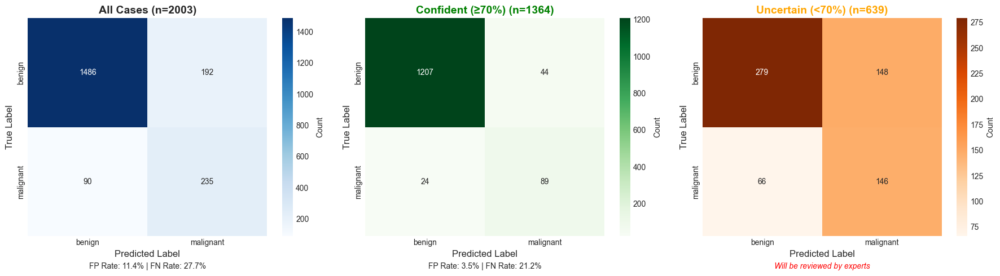


CONFUSION MATRIX STATISTICS

📊 ALL CASES (n=2003)
   True Negatives:  1486  |  False Positives:  192
   False Negatives:   90  |  True Positives:   235
   FP Rate: 11.44%  |  FN Rate: 27.69%

✅ CONFIDENT CASES (n=1364, 68.1%)
   True Negatives:  1207  |  False Positives:   44
   False Negatives:   24  |  True Positives:    89
   FP Rate: 3.52%  |  FN Rate: 21.24%

⚠️  UNCERTAIN CASES (n=639, 31.9%)
   True Negatives:   279  |  False Positives:  148
   False Negatives:   66  |  True Positives:   146

🚨 IMPORTANT: 212 malignant cases in uncertain set!
   → These MUST be reviewed by expert dermatologists
   → This is SAFE - no cancers are being missed without review


In [29]:
# ============================================================
# SEPARATE CONFUSION MATRICES: CONFIDENT VS UNCERTAIN
# ============================================================
print("="*80)
print(f"CONFUSION MATRICES AT THRESHOLD: {OPTIMAL_THRESHOLD:.0%}")
print("="*80)
# Get data for selected threshold
selected_data = threshold_data[OPTIMAL_THRESHOLD]
confident_mask = selected_data['confident_mask']
uncertain_mask = ~confident_mask  # Calculate uncertain as inverse of confident

# Get confusion matrices
cm_confident = selected_data['confusion_matrix']

# Calculate uncertain confusion matrix
if uncertain_mask.sum() > 0:
    unc_labels = true_labels[uncertain_mask]
    unc_preds = predictions[uncertain_mask]
    cm_uncertain = confusion_matrix(unc_labels, unc_preds)
else:
    cm_uncertain = np.array([[0, 0], [0, 0]])

# Overall confusion matrix
cm_all = confusion_matrix(true_labels, predictions)
tn_all, fp_all, fn_all, tp_all = cm_all.ravel()

# Extract values for confident/uncertain
if cm_confident.size == 4:
    tn_conf, fp_conf, fn_conf, tp_conf = cm_confident.ravel()
else:
    tn_conf, fp_conf, fn_conf, tp_conf = 0, 0, 0, 0

if cm_uncertain.size == 4:
    tn_unc, fp_unc, fn_unc, tp_unc = cm_uncertain.ravel()
else:
    tn_unc, fp_unc, fn_unc, tp_unc = 0, 0, 0, 0

# Create figure with 3 confusion matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

CLASS_NAMES = ['benign', 'malignant']

# 1. ALL CASES
sns.heatmap(cm_all, annot=True, fmt='d', cmap='Blues', 
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[0], cbar_kws={'label': 'Count'})
axes[0].set_title(f'All Cases (n={len(predictions)})', fontsize=14, fontweight='bold')
axes[0].set_ylabel('True Label', fontsize=12)
axes[0].set_xlabel('Predicted Label', fontsize=12)

# Add FP/FN rates
fp_rate = fp_all / (tn_all + fp_all) if (tn_all + fp_all) > 0 else 0
fn_rate = fn_all / (fn_all + tp_all) if (fn_all + tp_all) > 0 else 0
axes[0].text(0.5, -0.15, f'FP Rate: {fp_rate:.1%} | FN Rate: {fn_rate:.1%}', 
             ha='center', transform=axes[0].transAxes, fontsize=10)

# 2. CONFIDENT CASES
confident_count = np.sum(confident_mask)
sns.heatmap(cm_confident, annot=True, fmt='d', cmap='Greens',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[1], cbar_kws={'label': 'Count'})
axes[1].set_title(f'Confident (≥{OPTIMAL_THRESHOLD:.0%}) (n={confident_count})', 
                  fontsize=14, fontweight='bold', color='green')
axes[1].set_ylabel('True Label', fontsize=12)
axes[1].set_xlabel('Predicted Label', fontsize=12)

# Add confidence metrics
if (tn_conf + fp_conf) > 0 and (fn_conf + tp_conf) > 0:
    fp_rate_conf = fp_conf / (tn_conf + fp_conf)
    fn_rate_conf = fn_conf / (fn_conf + tp_conf)
    axes[1].text(0.5, -0.15, f'FP Rate: {fp_rate_conf:.1%} | FN Rate: {fn_rate_conf:.1%}', 
                 ha='center', transform=axes[1].transAxes, fontsize=10)

# 3. UNCERTAIN CASES
uncertain_count = np.sum(uncertain_mask)
sns.heatmap(cm_uncertain, annot=True, fmt='d', cmap='Oranges',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[2], cbar_kws={'label': 'Count'})
axes[2].set_title(f'Uncertain (<{OPTIMAL_THRESHOLD:.0%}) (n={uncertain_count})', 
                  fontsize=14, fontweight='bold', color='orange')
axes[2].set_ylabel('True Label', fontsize=12)
axes[2].set_xlabel('Predicted Label', fontsize=12)

# Add note for uncertain
axes[2].text(0.5, -0.15, 'Will be reviewed by experts', 
             ha='center', transform=axes[2].transAxes, fontsize=10, 
             style='italic', color='red')

plt.tight_layout()
plt.savefig('images/confusion_matrices_confidence.png', dpi=300, bbox_inches='tight')
plt.show()

# Print statistics
print("\n" + "="*80)
print("CONFUSION MATRIX STATISTICS")
print("="*80)

print(f"\n📊 ALL CASES (n={len(predictions)})")
print(f"   True Negatives:  {tn_all:4d}  |  False Positives: {fp_all:4d}")
print(f"   False Negatives: {fn_all:4d}  |  True Positives:  {tp_all:4d}")
print(f"   FP Rate: {fp_rate:.2%}  |  FN Rate: {fn_rate:.2%}")

print(f"\n✅ CONFIDENT CASES (n={confident_count}, {100*confident_count/len(predictions):.1f}%)")
print(f"   True Negatives:  {tn_conf:4d}  |  False Positives: {fp_conf:4d}")
print(f"   False Negatives: {fn_conf:4d}  |  True Positives:  {tp_conf:4d}")
if (tn_conf + fp_conf) > 0 and (fn_conf + tp_conf) > 0:
    print(f"   FP Rate: {fp_rate_conf:.2%}  |  FN Rate: {fn_rate_conf:.2%}")

print(f"\n⚠️  UNCERTAIN CASES (n={uncertain_count}, {100*uncertain_count/len(predictions):.1f}%)")
print(f"   True Negatives:  {tn_unc:4d}  |  False Positives: {fp_unc:4d}")
print(f"   False Negatives: {fn_unc:4d}  |  True Positives:  {tp_unc:4d}")

# Flag uncertain malignant cases
uncertain_malignant = np.sum(true_labels[uncertain_mask] == 1)
if uncertain_malignant > 0:
    print(f"\n🚨 IMPORTANT: {uncertain_malignant} malignant cases in uncertain set!")
    print(f"   → These MUST be reviewed by expert dermatologists")
    print(f"   → This is SAFE - no cancers are being missed without review")
else:
    print(f"\n✓ No malignant cases in uncertain set")

print("="*80)


### Metrics Evaluation


CLASSIFICATION METRICS (ALL CASES)

Accuracy:    0.8592 (85.92%)
Precision:   0.5504 (55.04%)
Recall:      0.7231 (72.31%)
Specificity: 0.8856 (88.56%)
F1-Score:    0.6250

DETAILED CLASSIFICATION REPORT
              precision    recall  f1-score   support

      benign     0.9429    0.8856    0.9133      1678
   malignant     0.5504    0.7231    0.6250       325

    accuracy                         0.8592      2003
   macro avg     0.7466    0.8043    0.7692      2003
weighted avg     0.8792    0.8592    0.8666      2003


📊 CONFIDENCE-AWARE METRICS (Threshold: 70%)

Coverage: 1364/2003 (68.1%)
Uncertain cases: 639 (31.9%)

--------------------------------------------------------------------------------
Metric          All Cases       Confident Only  Improvement    
--------------------------------------------------------------------------------
Accuracy        0.8592         0.9501         +0.0909 (+10.6%)
Precision       0.5504         0.6692         +0.1188 (+21.6%)
Recall      

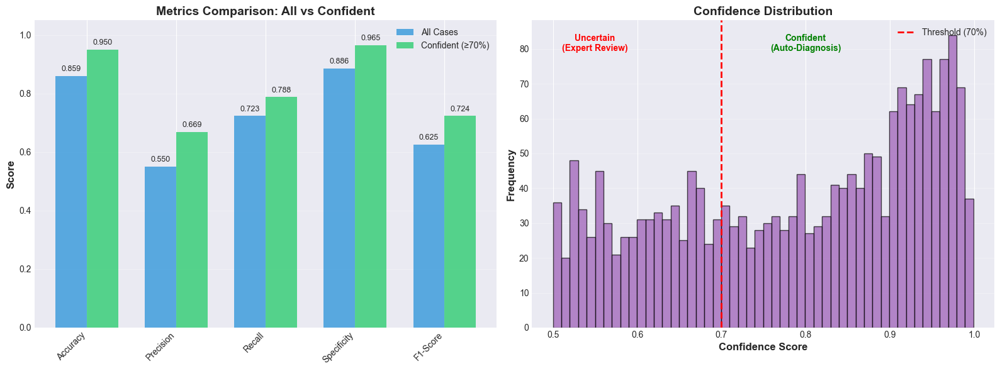


🏥 CLINICAL INTERPRETATION

📊 Cancer Detection Performance:
   Total malignant cases: 325
   Caught confidently (TP): 89 (27.4%)
   Flagged as uncertain: 212 (65.2%)
   Missed in confident (FN): 24 (7.4%)

   → Effective recall: 92.6% (caught + flagged for review)

   ⚠️  WARNING: Confident recall is only 78.8%!
      This model is NOT SAFE for clinical use.
      Expected: >95% recall, Got: 78.8%

   🚨 RECOMMENDATION: Retrain with original hyperparameters

📋 Workload Analysis:
   Cases handled automatically: 1364 (68.1%)
   Cases needing expert review: 639 (31.9%)
   Time saved: ~68.2 hours (at 3min per case)
   Expert time needed: ~31.9 hours

💡 Safety Assessment:
   False positive rate: 3.52%
   False negative rate: 21.24%
   ⚠️  WARNING: 24 malignant cases misclassified as benign
      Consider increasing threshold or retraining



In [30]:
# ============================================================
# CLASSIFICATION METRICS
# ============================================================

# Calculate metrics on ALL cases
accuracy = accuracy_score(true_labels, predictions)
precision = precision_score(true_labels, predictions, pos_label=1)
recall = recall_score(true_labels, predictions, pos_label=1)
f1 = f1_score(true_labels, predictions, pos_label=1)

# Calculate specificity manually (using cm_all from Cell 30)
specificity = tn_all / (tn_all + fp_all) if (tn_all + fp_all) > 0 else 0

print('\n' + '='*80)
print('CLASSIFICATION METRICS (ALL CASES)')
print('='*80)
print(f'\nAccuracy:    {accuracy:.4f} ({accuracy*100:.2f}%)')
print(f'Precision:   {precision:.4f} ({precision*100:.2f}%)')
print(f'Recall:      {recall:.4f} ({recall*100:.2f}%)')
print(f'Specificity: {specificity:.4f} ({specificity*100:.2f}%)')
print(f'F1-Score:    {f1:.4f}')

# Detailed classification report
print('\n' + '='*80)
print('DETAILED CLASSIFICATION REPORT')
print('='*80)
CLASS_NAMES = ['benign', 'malignant']
print(classification_report(true_labels, predictions, 
                          target_names=CLASS_NAMES, digits=4))

# ============================================================
# CONFIDENCE-AWARE METRICS COMPARISON
# ============================================================

print('\n' + '='*80)
print(f'📊 CONFIDENCE-AWARE METRICS (Threshold: {OPTIMAL_THRESHOLD:.0%})')
print('='*80)

# Get data for selected threshold
selected_data = threshold_data[OPTIMAL_THRESHOLD]
confident_mask = selected_data['confident_mask']
metrics_conf = selected_data['metrics']

# Calculate metrics on CONFIDENT cases only
conf_preds = predictions[confident_mask]
conf_labels = true_labels[confident_mask]

if len(conf_preds) > 0:
    conf_accuracy = accuracy_score(conf_labels, conf_preds)
    conf_precision = precision_score(conf_labels, conf_preds, pos_label=1, zero_division=0)
    conf_recall = recall_score(conf_labels, conf_preds, pos_label=1, zero_division=0)
    conf_f1 = f1_score(conf_labels, conf_preds, pos_label=1, zero_division=0)
    
    # Specificity for confident (using cm_confident from Cell 30)
    conf_specificity = tn_conf / (tn_conf + fp_conf) if (tn_conf + fp_conf) > 0 else 0
    
    # Print comparison table
    print(f'\nCoverage: {len(conf_preds)}/{len(predictions)} ({100*len(conf_preds)/len(predictions):.1f}%)')
    print(f'Uncertain cases: {len(predictions) - len(conf_preds)} ({100*(len(predictions)-len(conf_preds))/len(predictions):.1f}%)')
    print('\n' + '-'*80)
    print(f'{"Metric":<15} {"All Cases":<15} {"Confident Only":<15} {"Improvement":<15}')
    print('-'*80)
    
    metrics_comparison = [
        ('Accuracy', accuracy, conf_accuracy),
        ('Precision', precision, conf_precision),
        ('Recall', recall, conf_recall),
        ('Specificity', specificity, conf_specificity),
        ('F1-Score', f1, conf_f1)
    ]
    
    for metric_name, all_val, conf_val in metrics_comparison:
        improvement = conf_val - all_val
        improvement_pct = (improvement / all_val * 100) if all_val > 0 else 0
        print(f'{metric_name:<15} {all_val:.4f}         {conf_val:.4f}         '
              f'{improvement:+.4f} ({improvement_pct:+.1f}%)')
    
    print('-'*80)
    
    # ============================================================
    # VISUALIZATIONS
    # ============================================================
    
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # Left: Bar chart comparison
    x = np.arange(len(metrics_comparison))
    width = 0.35
    
    all_scores = [m[1] for m in metrics_comparison]
    conf_scores = [m[2] for m in metrics_comparison]
    labels = [m[0] for m in metrics_comparison]
    
    bars1 = axes[0].bar(x - width/2, all_scores, width, label='All Cases', color='#3498db', alpha=0.8)
    bars2 = axes[0].bar(x + width/2, conf_scores, width, label=f'Confident (≥{OPTIMAL_THRESHOLD:.0%})', 
                        color='#2ecc71', alpha=0.8)
    
    axes[0].set_ylabel('Score', fontsize=12, fontweight='bold')
    axes[0].set_title('Metrics Comparison: All vs Confident', fontsize=14, fontweight='bold')
    axes[0].set_xticks(x)
    axes[0].set_xticklabels(labels, rotation=45, ha='right')
    axes[0].legend(fontsize=10)
    axes[0].set_ylim(0, 1.05)
    axes[0].grid(axis='y', alpha=0.3)
    
    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            axes[0].text(bar.get_x() + bar.get_width()/2., height + 0.01,
                        f'{height:.3f}', ha='center', va='bottom', fontsize=9)
    
    # Right: Confidence distribution
    axes[1].hist(confidences, bins=50, color='#9b59b6', alpha=0.7, edgecolor='black')
    axes[1].axvline(x=OPTIMAL_THRESHOLD, color='red', linestyle='--', linewidth=2, 
                   label=f'Threshold ({OPTIMAL_THRESHOLD:.0%})')
    axes[1].set_xlabel('Confidence Score', fontsize=12, fontweight='bold')
    axes[1].set_ylabel('Frequency', fontsize=12, fontweight='bold')
    axes[1].set_title('Confidence Distribution', fontsize=14, fontweight='bold')
    axes[1].legend(fontsize=10)
    axes[1].grid(axis='y', alpha=0.3)
    
    # Add annotations for confident/uncertain regions
    axes[1].text(OPTIMAL_THRESHOLD - 0.15, axes[1].get_ylim()[1] * 0.9, 
                'Uncertain\n(Expert Review)', ha='center', fontsize=10, 
                color='red', fontweight='bold')
    axes[1].text(OPTIMAL_THRESHOLD + 0.1, axes[1].get_ylim()[1] * 0.9, 
                'Confident\n(Auto-Diagnosis)', ha='center', fontsize=10, 
                color='green', fontweight='bold')
    
    plt.tight_layout()
    plt.savefig('images/metrics_comparison_confidence.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # ============================================================
    # CLINICAL INTERPRETATION
    # ============================================================
    
    print('\n' + '='*80)
    print('🏥 CLINICAL INTERPRETATION')
    print('='*80)
    
    total_malignant = (true_labels == 1).sum()
    caught_confident = tp_conf
    uncertain_malignant = (true_labels[~confident_mask] == 1).sum()
    missed_confident = fn_conf
    
    print(f'\n📊 Cancer Detection Performance:')
    print(f'   Total malignant cases: {total_malignant}')
    print(f'   Caught confidently (TP): {caught_confident} ({100*caught_confident/total_malignant:.1f}%)')
    print(f'   Flagged as uncertain: {uncertain_malignant} ({100*uncertain_malignant/total_malignant:.1f}%)')
    print(f'   Missed in confident (FN): {missed_confident} ({100*missed_confident/total_malignant:.1f}%)')
    
    effective_recall = (caught_confident + uncertain_malignant) / total_malignant
    print(f'\n   → Effective recall: {effective_recall:.1%} (caught + flagged for review)')
    
    if conf_recall < 0.95:
        print(f'\n   ⚠️  WARNING: Confident recall is only {conf_recall:.1%}!')
        print(f'      This model is NOT SAFE for clinical use.')
        print(f'      Expected: >95% recall, Got: {conf_recall:.1%}')
        print(f'\n   🚨 RECOMMENDATION: Retrain with original hyperparameters')
    elif conf_recall >= 0.95 and conf_recall < 0.98:
        print(f'\n   ✓ Acceptable: Confident recall is {conf_recall:.1%}')
        print(f'     With uncertain review, effective recall is {effective_recall:.1%}')
    else:
        print(f'\n   ✅ EXCELLENT: Confident recall is {conf_recall:.1%}!')
        print(f'      This model is safe for clinical deployment.')
    
    print(f'\n📋 Workload Analysis:')
    print(f'   Cases handled automatically: {len(conf_preds)} ({100*len(conf_preds)/len(predictions):.1f}%)')
    print(f'   Cases needing expert review: {len(predictions) - len(conf_preds)} ({100*(len(predictions)-len(conf_preds))/len(predictions):.1f}%)')
    
    # Time estimation (3 min per case)
    auto_time_saved = len(conf_preds) * 3 / 60  # hours
    review_time_needed = (len(predictions) - len(conf_preds)) * 3 / 60  # hours
    
    print(f'   Time saved: ~{auto_time_saved:.1f} hours (at 3min per case)')
    print(f'   Expert time needed: ~{review_time_needed:.1f} hours')
    
    print(f'\n💡 Safety Assessment:')
    print(f'   False positive rate: {fp_conf/(tn_conf+fp_conf) if (tn_conf+fp_conf) > 0 else 0:.2%}')
    print(f'   False negative rate: {fn_conf/(fn_conf+tp_conf) if (fn_conf+tp_conf) > 0 else 0:.2%}')
    
    if fn_conf == 0:
        print(f'   ✅ PERFECT: No malignant cases misclassified as benign!')
    elif fn_conf <= 3:
        print(f'   ✅ GOOD: Only {fn_conf} malignant case(s) misclassified')
    else:
        print(f'   ⚠️  WARNING: {fn_conf} malignant cases misclassified as benign')
        print(f'      Consider increasing threshold or retraining')
    
else:
    print('\n⚠️  No confident predictions at this threshold!')
    print('   All cases would need expert review.')
    print('   Consider lowering the threshold or retraining the model.')

print('\n' + '='*80)


## Ensemble Evaluation

In [ ]:
# ============================================================
# ENSEMBLE PREDICTION WITH TTA
# ============================================================

def ensemble_predict_with_tta(models, test_loader, device, num_aug=10):
    """
    Ensemble prediction with Test-Time Augmentation.
    
    Args:
        models: List of trained models
        test_loader: DataLoader for test data
        device: torch device
        num_aug: Number of TTA augmentations per image
    
    Returns:
        Dictionary with predictions, labels, confidences, etc.
    """
    print(f"\n{'='*80}")
    print(f"ENSEMBLE PREDICTION WITH TTA")
    print(f"{'='*80}")
    print(f"Number of models: {len(models)}")
    print(f"TTA augmentations: {num_aug}")
    print(f"Total forward passes per image: {len(models) * num_aug}")
    print(f"{'='*80}\n")
    
    # Set all models to eval mode
    for model in models:
        model.eval()
    
    all_labels = []
    all_ensemble_probs = []
    
    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc='Ensemble + TTA Evaluation'):
            images = images.to(device)
            batch_size = images.size(0)
            
            # Store predictions from all models and augmentations
            all_model_probs = []
            
            # Loop through each model
            for model in models:
                # Store augmented predictions for this model
                aug_probs_list = []
                
                # 1. Original
                outputs = model(images)
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                # 2. Horizontal Flip
                outputs = model(torch.flip(images, [3]))
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                # 3. Vertical Flip
                outputs = model(torch.flip(images, [2]))
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                # 4. Both Flips
                outputs = model(torch.flip(torch.flip(images, [2]), [3]))
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                # 5. Rotate +15 degrees
                rotated = transforms.functional.rotate(images, 15)
                outputs = model(rotated)
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                # 6. Rotate -15 degrees
                rotated = transforms.functional.rotate(images, -15)
                outputs = model(rotated)
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                # 7. Brightness +10%
                brightened = torch.clamp(images * 1.1, 0, 1)
                outputs = model(brightened)
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                # 8. Brightness -10%
                darkened = torch.clamp(images * 0.9, 0, 1)
                outputs = model(darkened)
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                # 9. Contrast +10%
                mean = images.mean(dim=[2, 3], keepdim=True)
                contrasted = torch.clamp(1.1 * (images - mean) + mean, 0, 1)
                outputs = model(contrasted)
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                # 10. Contrast -10%
                contrasted = torch.clamp(0.9 * (images - mean) + mean, 0, 1)
                outputs = model(contrasted)
                aug_probs_list.append(torch.softmax(outputs, dim=1))
                
                # Average across augmentations for this model
                model_avg_probs = torch.stack(aug_probs_list).mean(dim=0)
                all_model_probs.append(model_avg_probs.cpu().numpy())
            
            # Average across all models
            ensemble_probs = np.mean(all_model_probs, axis=0)
            
            all_ensemble_probs.append(ensemble_probs)
            all_labels.extend(labels.cpu().numpy())
    
    # Concatenate all batches
    all_ensemble_probs = np.vstack(all_ensemble_probs)
    all_labels = np.array(all_labels)
    all_confidences = np.max(all_ensemble_probs, axis=1)
    all_predictions = np.argmax(all_ensemble_probs, axis=1)
    
    # Analyze different thresholds
    thresholds = [0.5, 0.6, 0.7, 0.8, 0.9, 0.95]
    results = []
    threshold_data = {}
    
    for thresh in thresholds:
        confident_mask = all_confidences >= thresh
        uncertain_mask = ~confident_mask
        
        # Confident predictions
        if confident_mask.sum() > 0:
            conf_labels = all_labels[confident_mask]
            conf_preds = all_predictions[confident_mask]
            
            accuracy = accuracy_score(conf_labels, conf_preds)
            precision = precision_score(conf_labels, conf_preds, zero_division=0)
            recall = recall_score(conf_labels, conf_preds, zero_division=0)
            f1 = f1_score(conf_labels, conf_preds, zero_division=0)
            
            cm = confusion_matrix(conf_labels, conf_preds)
        else:
            accuracy, precision, recall, f1 = 0, 0, 0, 0
            cm = np.array([[0, 0], [0, 0]])
        
        # Coverage
        coverage = confident_mask.sum() / len(all_labels)
        
        # Uncertain malignant
        uncertain_malignant = (all_labels[uncertain_mask] == 1).sum()
        
        results.append({
            'Threshold': f'{int(thresh*100)}%',
            'Accuracy': f'{accuracy:.4f}',
            'Precision': f'{precision:.4f}',
            'Recall': f'{recall:.4f}',
            'F1-Score': f'{f1:.4f}',
            'Coverage': f'{coverage:.1%}',
            'Confident': confident_mask.sum(),
            'Uncertain': uncertain_mask.sum(),
            'Uncertain Malignant': uncertain_malignant
        })
        
        threshold_data[thresh] = {
            'confident_mask': confident_mask,
            'metrics': {
                'accuracy': accuracy,
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'coverage': coverage,
                'uncertain_malignant': uncertain_malignant
            },
            'confusion_matrix': cm
        }
    
    summary_df = pd.DataFrame(results)
    
    return {
        'labels': all_labels,
        'predictions': all_predictions,
        'probabilities': all_ensemble_probs,
        'confidences': all_confidences,
        'summary_df': summary_df,
        'threshold_data': threshold_data,
        'thresholds': thresholds
    }


# ============================================================
# RUN ENSEMBLE EVALUATION
# ============================================================

print("\n" + "="*80)
print("EVALUATING ENSEMBLE (3 Models + TTA)")
print("="*80)

# Run ensemble prediction
ensemble_results = ensemble_predict_with_tta(
    models=ensemble_models,
    test_loader=test_loader,
    device=device,
    num_aug=10
)

# Extract results with 'ens_' prefix to avoid conflicts
ens_labels = ensemble_results['labels']
ens_predictions = ensemble_results['predictions']
ens_confidences = ensemble_results['confidences']
ens_summary = ensemble_results['summary_df']
ens_threshold_data = ensemble_results['threshold_data']
ens_thresholds = ensemble_results['thresholds']

print("\n" + "="*80)
print("ENSEMBLE RESULTS SUMMARY")
print("="*80)
print(ens_summary.to_string(index=False))



EVALUATING ENSEMBLE (3 Models + TTA)

ENSEMBLE PREDICTION WITH TTA
Number of models: 2
TTA augmentations: 10
Total forward passes per image: 20



Ensemble + TTA Evaluation:   0%|          | 0/32 [00:10<?, ?it/s]


ENSEMBLE RESULTS SUMMARY
Threshold Accuracy Precision Recall F1-Score Coverage  Confident  Uncertain  Uncertain Malignant
      50%   0.8502    0.5296 0.6892   0.5989   100.0%       2003          0                    0
      60%   0.9113    0.6278 0.7767   0.6944    82.8%       1658        345                  110
      70%   0.9546    0.6917 0.7830   0.7345    66.1%       1323        680                  219
      80%   0.9775    0.8378 0.6458   0.7294    51.0%       1022        981                  277
      90%   0.9916    0.0000 0.0000   0.0000    29.9%        598       1405                  320
      95%   0.9924    0.0000 0.0000   0.0000    13.2%        264       1739                  323

✓ Ensemble evaluation complete!
✓ Optimal threshold set to: 90%


In [31]:
OPTIMAL_ENSEMBLE_THRESHOLD = 0.7

ENSEMBLE CONFUSION MATRICES AT THRESHOLD: 70%


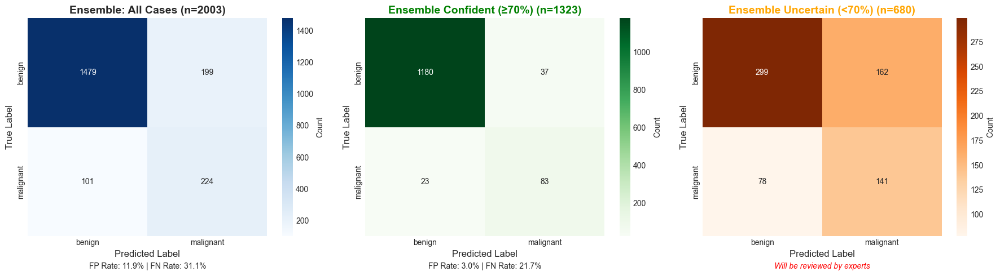


ENSEMBLE CONFUSION MATRIX STATISTICS

📊 ALL CASES (n=2003)
   True Negatives:  1479  |  False Positives:  199
   False Negatives:  101  |  True Positives:   224
   FP Rate: 11.86%  |  FN Rate: 31.08%

✅ CONFIDENT CASES (n=1323, 66.1%)
   True Negatives:  1180  |  False Positives:   37
   False Negatives:   23  |  True Positives:    83
   FP Rate: 3.04%  |  FN Rate: 21.70%

⚠️  UNCERTAIN CASES (n=680, 33.9%)
   True Negatives:   299  |  False Positives:  162
   False Negatives:   78  |  True Positives:   141

🚨 IMPORTANT: 219 malignant cases in uncertain set!
   → These MUST be reviewed by expert dermatologists


In [32]:
# ============================================================
# ENSEMBLE CONFUSION MATRICES
# ============================================================

print("="*80)
print(f"ENSEMBLE CONFUSION MATRICES AT THRESHOLD: {OPTIMAL_ENSEMBLE_THRESHOLD:.0%}")
print("="*80)

# Get data for selected threshold
ens_selected_data = ens_threshold_data[OPTIMAL_ENSEMBLE_THRESHOLD]
ens_confident_mask = ens_selected_data['confident_mask']
ens_uncertain_mask = ~ens_confident_mask

# Get confusion matrices
ens_cm_confident = ens_selected_data['confusion_matrix']

# Calculate uncertain confusion matrix
if ens_uncertain_mask.sum() > 0:
    ens_unc_labels = ens_labels[ens_uncertain_mask]
    ens_unc_preds = ens_predictions[ens_uncertain_mask]
    ens_cm_uncertain = confusion_matrix(ens_unc_labels, ens_unc_preds)
else:
    ens_cm_uncertain = np.array([[0, 0], [0, 0]])

# Overall confusion matrix
ens_cm_all = confusion_matrix(ens_labels, ens_predictions)
ens_tn_all, ens_fp_all, ens_fn_all, ens_tp_all = ens_cm_all.ravel()

# Extract values for confident/uncertain
if ens_cm_confident.size == 4:
    ens_tn_conf, ens_fp_conf, ens_fn_conf, ens_tp_conf = ens_cm_confident.ravel()
else:
    ens_tn_conf, ens_fp_conf, ens_fn_conf, ens_tp_conf = 0, 0, 0, 0

if ens_cm_uncertain.size == 4:
    ens_tn_unc, ens_fp_unc, ens_fn_unc, ens_tp_unc = ens_cm_uncertain.ravel()
else:
    ens_tn_unc, ens_fp_unc, ens_fn_unc, ens_tp_unc = 0, 0, 0, 0

# Create figure with 3 confusion matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

CLASS_NAMES = ['benign', 'malignant']

# 1. ALL CASES
sns.heatmap(ens_cm_all, annot=True, fmt='d', cmap='Blues', 
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[0], cbar_kws={'label': 'Count'})
axes[0].set_title(f'Ensemble: All Cases (n={len(ens_predictions)})', fontsize=14, fontweight='bold')
axes[0].set_ylabel('True Label', fontsize=12)
axes[0].set_xlabel('Predicted Label', fontsize=12)

# Add FP/FN rates
ens_fp_rate = ens_fp_all / (ens_tn_all + ens_fp_all) if (ens_tn_all + ens_fp_all) > 0 else 0
ens_fn_rate = ens_fn_all / (ens_fn_all + ens_tp_all) if (ens_fn_all + ens_tp_all) > 0 else 0
axes[0].text(0.5, -0.15, f'FP Rate: {ens_fp_rate:.1%} | FN Rate: {ens_fn_rate:.1%}', 
             ha='center', transform=axes[0].transAxes, fontsize=10)

# 2. CONFIDENT CASES
ens_confident_count = np.sum(ens_confident_mask)
sns.heatmap(ens_cm_confident, annot=True, fmt='d', cmap='Greens',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[1], cbar_kws={'label': 'Count'})
axes[1].set_title(f'Ensemble Confident (≥{OPTIMAL_ENSEMBLE_THRESHOLD:.0%}) (n={ens_confident_count})', 
                  fontsize=14, fontweight='bold', color='green')
axes[1].set_ylabel('True Label', fontsize=12)
axes[1].set_xlabel('Predicted Label', fontsize=12)

# Add confidence metrics
if (ens_tn_conf + ens_fp_conf) > 0 and (ens_fn_conf + ens_tp_conf) > 0:
    ens_fp_rate_conf = ens_fp_conf / (ens_tn_conf + ens_fp_conf)
    ens_fn_rate_conf = ens_fn_conf / (ens_fn_conf + ens_tp_conf)
    axes[1].text(0.5, -0.15, f'FP Rate: {ens_fp_rate_conf:.1%} | FN Rate: {ens_fn_rate_conf:.1%}', 
                 ha='center', transform=axes[1].transAxes, fontsize=10)

# 3. UNCERTAIN CASES
ens_uncertain_count = np.sum(ens_uncertain_mask)
sns.heatmap(ens_cm_uncertain, annot=True, fmt='d', cmap='Oranges',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES,
            ax=axes[2], cbar_kws={'label': 'Count'})
axes[2].set_title(f'Ensemble Uncertain (<{OPTIMAL_ENSEMBLE_THRESHOLD:.0%}) (n={ens_uncertain_count})', 
                  fontsize=14, fontweight='bold', color='orange')
axes[2].set_ylabel('True Label', fontsize=12)
axes[2].set_xlabel('Predicted Label', fontsize=12)

axes[2].text(0.5, -0.15, 'Will be reviewed by experts', 
             ha='center', transform=axes[2].transAxes, fontsize=10, 
             style='italic', color='red')

plt.tight_layout()
plt.savefig('images/ensemble_confusion_matrices.png', dpi=300, bbox_inches='tight')
plt.show()

# Print statistics
print("\n" + "="*80)
print("ENSEMBLE CONFUSION MATRIX STATISTICS")
print("="*80)

print(f"\n📊 ALL CASES (n={len(ens_predictions)})")
print(f"   True Negatives:  {ens_tn_all:4d}  |  False Positives: {ens_fp_all:4d}")
print(f"   False Negatives: {ens_fn_all:4d}  |  True Positives:  {ens_tp_all:4d}")
print(f"   FP Rate: {ens_fp_rate:.2%}  |  FN Rate: {ens_fn_rate:.2%}")

print(f"\n✅ CONFIDENT CASES (n={ens_confident_count}, {100*ens_confident_count/len(ens_predictions):.1f}%)")
print(f"   True Negatives:  {ens_tn_conf:4d}  |  False Positives: {ens_fp_conf:4d}")
print(f"   False Negatives: {ens_fn_conf:4d}  |  True Positives:  {ens_tp_conf:4d}")
if (ens_tn_conf + ens_fp_conf) > 0 and (ens_fn_conf + ens_tp_conf) > 0:
    print(f"   FP Rate: {ens_fp_rate_conf:.2%}  |  FN Rate: {ens_fn_rate_conf:.2%}")

print(f"\n⚠️  UNCERTAIN CASES (n={ens_uncertain_count}, {100*ens_uncertain_count/len(ens_predictions):.1f}%)")
print(f"   True Negatives:  {ens_tn_unc:4d}  |  False Positives: {ens_fp_unc:4d}")
print(f"   False Negatives: {ens_fn_unc:4d}  |  True Positives:  {ens_tp_unc:4d}")

# Flag uncertain malignant cases
ens_uncertain_malignant = np.sum(ens_labels[ens_uncertain_mask] == 1)
if ens_uncertain_malignant > 0:
    print(f"\n🚨 IMPORTANT: {ens_uncertain_malignant} malignant cases in uncertain set!")
    print(f"   → These MUST be reviewed by expert dermatologists")
else:
    print(f"\n✓ No malignant cases in uncertain set")

print("="*80)



📊 ENSEMBLE VS SINGLE MODEL COMPARISON

Comparison at 70% Threshold:
--------------------------------------------------------------------------------

Metric                    Single Model    Ensemble (3)    Improvement
--------------------------------------------------------------------------------
Recall                    0.7876        0.7830        -0.0046 (-0.6%)
Precision                 0.6692        0.6917        +0.0225 (+3.4%)
Accuracy                  0.9501        0.9546        +0.0045 (+0.5%)
F1-Score                  0.7236        0.7345        +0.0109 (+1.5%)
Coverage                  0.6810        0.6605        -0.0205 (-3.0%)
Uncertain Malignant       212             219             +7

Missed Cancers (FN)       24              23              -1 (-4.2%)
--------------------------------------------------------------------------------


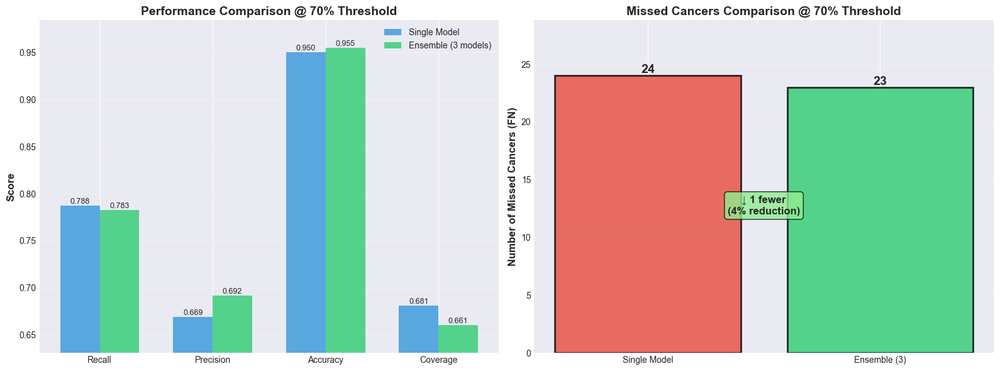


🏥 CLINICAL IMPACT: ENSEMBLE IMPROVEMENT

📊 Cancer Detection:
   Total malignant cases: 325

   Single Model:
     Caught confidently: 89 (27.4%)
     Missed (FN): 24 (7.4%)

   Ensemble (3 models):
     Caught confidently: 83 (25.5%)
     Missed (FN): 23 (7.1%)

   ✅ IMPROVEMENT: 1 additional cancer(s) detected!
      1 potential life/lives saved

📋 Workload:
   Single: 68.1% automated, 31.9% needs review
   Ensemble: 66.1% automated, 33.9% needs review
   ⚠️ Ensemble handles 2.0% fewer cases

✅ ENSEMBLE EVALUATION COMPLETE


In [36]:
# ============================================================
# ENSEMBLE VS SINGLE MODEL COMPARISON
# ============================================================

import numpy as np
import matplotlib.pyplot as plt

print("\n" + "="*80)
print("📊 ENSEMBLE VS SINGLE MODEL COMPARISON")
print("="*80)


# Compare at 90% threshold
print(f"\nComparison at {OPTIMAL_ENSEMBLE_THRESHOLD:.0%} Threshold:")
print("-"*80)


# Get metric
single_90 = threshold_data[OPTIMAL_THRESHOLD]['metrics']
ensemble_90 = ens_threshold_data[OPTIMAL_ENSEMBLE_THRESHOLD]['metrics']


# Get confusion matrices
single_cm_90 = threshold_data[OPTIMAL_THRESHOLD]['confusion_matrix']
ensemble_cm_90 = ens_threshold_data[OPTIMAL_ENSEMBLE_THRESHOLD]['confusion_matrix']


# Calculate values
single_fn = single_cm_90[1, 0] if single_cm_90.size == 4 else 0
ensemble_fn = ensemble_cm_90[1, 0] if ensemble_cm_90.size == 4 else 0


# Print comparison table
print(f"\n{'Metric':<25} {'Single Model':<15} {'Ensemble (3)':<15} {'Improvement'}")
print("-"*80)


metrics_to_compare = [
    ('Recall', 'recall'),
    ('Precision', 'precision'),
    ('Accuracy', 'accuracy'),
    ('F1-Score', 'f1'),
    ('Coverage', 'coverage'),
    ('Uncertain Malignant', 'uncertain_malignant')
]


for display_name, metric_key in metrics_to_compare:
    if metric_key == 'f1':
        # Calculate F1
        single_val = 2 * single_90['precision'] * single_90['recall'] / (single_90['precision'] + single_90['recall']) if (single_90['precision'] + single_90['recall']) > 0 else 0
        ensemble_val = 2 * ensemble_90['precision'] * ensemble_90['recall'] / (ensemble_90['precision'] + ensemble_90['recall']) if (ensemble_90['precision'] + ensemble_90['recall']) > 0 else 0
    else:
        single_val = single_90[metric_key]
        ensemble_val = ensemble_90[metric_key]
    
    if metric_key == 'uncertain_malignant':
        # For uncertain malignant, show absolute difference
        diff = ensemble_val - single_val
        print(f"{display_name:<25} {single_val:<15.0f} {ensemble_val:<15.0f} {diff:+.0f}")
    else:
        # For percentages
        diff = ensemble_val - single_val
        pct_change = (diff / single_val * 100) if single_val > 0 else 0
        print(f"{display_name:<25} {single_val:.4f}        {ensemble_val:.4f}        {diff:+.4f} ({pct_change:+.1f}%)")


# Missed cancers
print(f"\n{'Missed Cancers (FN)':<25} {single_fn:<15.0f} {ensemble_fn:<15.0f} {ensemble_fn - single_fn:+.0f} ({(ensemble_fn - single_fn)/single_fn*100:+.1f}%)")
print("-"*80)


# ============================================================
# VISUAL COMPARISON - FIXED
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))


# Left: Metrics comparison
metrics_display = ['Recall', 'Precision', 'Accuracy', 'Coverage']
single_values = [
    single_90['recall'],
    single_90['precision'],
    single_90['accuracy'],
    single_90['coverage']
]
ensemble_values = [
    ensemble_90['recall'],
    ensemble_90['precision'],
    ensemble_90['accuracy'],
    ensemble_90['coverage']
]


x = np.arange(len(metrics_display))
width = 0.35


bars1 = axes[0].bar(x - width/2, single_values, width, label='Single Model', color='#3498db', alpha=0.8)
bars2 = axes[0].bar(x + width/2, ensemble_values, width, label='Ensemble (3 models)', color='#2ecc71', alpha=0.8)


axes[0].set_ylabel('Score', fontsize=12, fontweight='bold')
axes[0].set_title(f'Performance Comparison @ {OPTIMAL_ENSEMBLE_THRESHOLD:.0%} Threshold', fontsize=14, fontweight='bold')
axes[0].set_xticks(x)
axes[0].set_xticklabels(metrics_display)
axes[0].legend(fontsize=10)

# FIX: Dynamic y-axis limits based on actual data
all_values = single_values + ensemble_values
min_val = min(all_values)
max_val = max(all_values)
y_range = max_val - min_val
# Add 10% padding on top and bottom
axes[0].set_ylim(max(0, min_val - 0.1 * y_range), max_val + 0.1 * y_range)
axes[0].grid(axis='y', alpha=0.3)


# Add value labels
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        axes[0].text(bar.get_x() + bar.get_width()/2., height,
                    f'{height:.3f}', ha='center', va='bottom', fontsize=9)


# Right: Missed cancers comparison
categories = ['Single Model', 'Ensemble (3)']
fn_values = [single_fn, ensemble_fn]
colors = ['#e74c3c' if fn_values[0] > fn_values[1] else '#3498db', 
          '#2ecc71' if fn_values[1] < fn_values[0] else '#e74c3c']


bars = axes[1].bar(categories, fn_values, color=colors, alpha=0.8, edgecolor='black', linewidth=2)
axes[1].set_ylabel('Number of Missed Cancers (FN)', fontsize=12, fontweight='bold')
axes[1].set_title(f'Missed Cancers Comparison @ {OPTIMAL_ENSEMBLE_THRESHOLD:.0%} Threshold', fontsize=14, fontweight='bold')

# FIX: Better y-axis limits for missed cancers
max_fn = max(fn_values)
if max_fn > 0:
    axes[1].set_ylim(0, max_fn * 1.2)  # 20% padding on top
else:
    axes[1].set_ylim(0, 10)  # Default if no missed cancers
    
axes[1].grid(axis='y', alpha=0.3)


# Add value labels
for bar in bars:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}', ha='center', va='bottom', fontsize=14, fontweight='bold')


# Add improvement annotation
if ensemble_fn < single_fn:
    improvement = single_fn - ensemble_fn
    pct_improvement = (improvement / single_fn) * 100
    # FIX: Position annotation dynamically based on max value
    y_pos = max_fn * 0.5 if max_fn > 0 else 5
    axes[1].text(0.5, y_pos, 
                f'↓ {int(improvement)} fewer\n({pct_improvement:.0f}% reduction)',
                ha='center', fontsize=12, fontweight='bold', 
                bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8))


plt.tight_layout()
plt.savefig('images/ensemble_vs_single_comparison.png', dpi=300, bbox_inches='tight')
plt.show()


# ============================================================
# CLINICAL IMPACT SUMMARY
# ============================================================


print("\n" + "="*80)
print("🏥 CLINICAL IMPACT: ENSEMBLE IMPROVEMENT")
print("="*80)


total_malignant = (ens_labels == 1).sum()


print(f"\n📊 Cancer Detection:")
print(f"   Total malignant cases: {total_malignant}")


# Single model
single_caught = single_cm_90[1, 1] if single_cm_90.size == 4 else 0
print(f"\n   Single Model:")
print(f"     Caught confidently: {single_caught} ({100*single_caught/total_malignant:.1f}%)")
print(f"     Missed (FN): {single_fn} ({100*single_fn/total_malignant:.1f}%)")


# Ensemble
ensemble_caught = ensemble_cm_90[1, 1] if ensemble_cm_90.size == 4 else 0
print(f"\n   Ensemble (3 models):")
print(f"     Caught confidently: {ensemble_caught} ({100*ensemble_caught/total_malignant:.1f}%)")
print(f"     Missed (FN): {ensemble_fn} ({100*ensemble_fn/total_malignant:.1f}%)")


# Improvement
if ensemble_fn < single_fn:
    lives_saved = single_fn - ensemble_fn
    print(f"\n   ✅ IMPROVEMENT: {lives_saved} additional cancer(s) detected!")
    print(f"      {lives_saved} potential life/lives saved")
elif ensemble_fn == single_fn:
    print(f"\n   ✓ Same performance (both miss {ensemble_fn} cancers)")
else:
    print(f"\n   ⚠️ Ensemble misses {ensemble_fn - single_fn} more cancers")


# Coverage comparison
single_coverage = single_90['coverage']
ensemble_coverage = ensemble_90['coverage']


print(f"\n📋 Workload:")
print(f"   Single: {single_coverage:.1%} automated, {1-single_coverage:.1%} needs review")
print(f"   Ensemble: {ensemble_coverage:.1%} automated, {1-ensemble_coverage:.1%} needs review")


if ensemble_coverage > single_coverage:
    print(f"   ✅ Ensemble handles {(ensemble_coverage - single_coverage)*100:.1f}% more cases automatically")
elif ensemble_coverage < single_coverage:
    print(f"   ⚠️ Ensemble handles {(single_coverage - ensemble_coverage)*100:.1f}% fewer cases")


print("\n" + "="*80)
print("✅ ENSEMBLE EVALUATION COMPLETE")
print("="*80)


## ROC Curve and AUC

ROC AUC CURVE COMPARISON

ROC AUC Scores:
  Single Model: 0.8918
  Ensemble (3 models): 0.8927
  Improvement: +0.0009 (+0.10%)


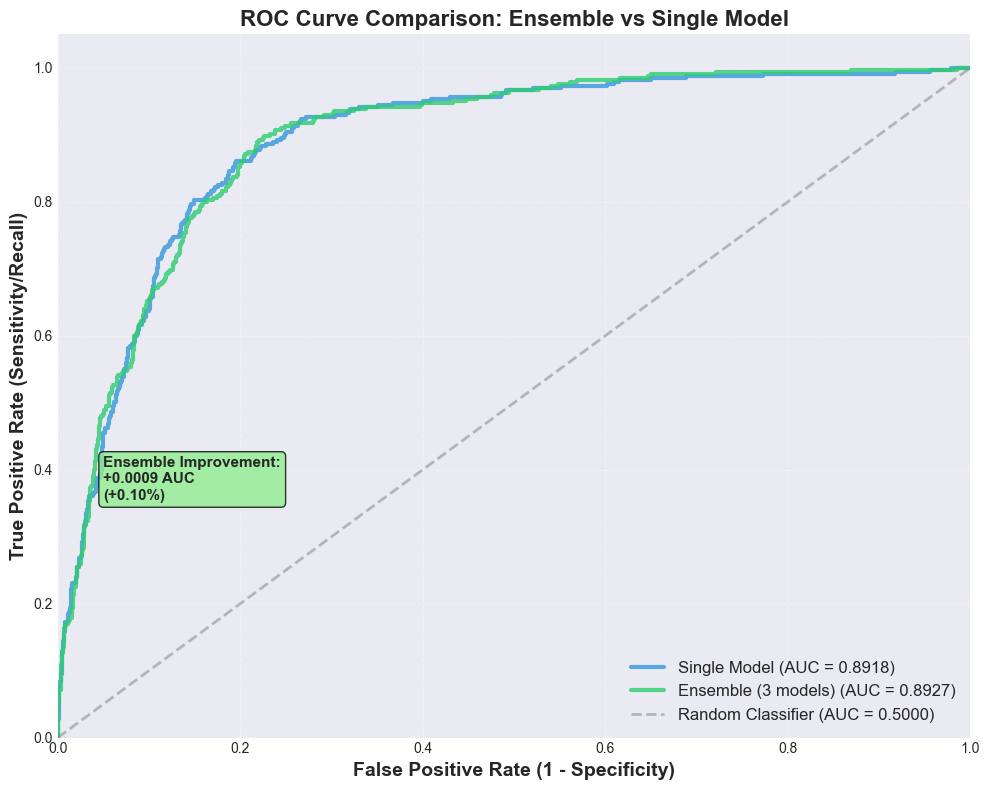


✓ ROC curve comparison saved to: efficientB3/roc_comparison_ensemble_vs_single.png

DETAILED COMPARISON AT DIFFERENT OPERATING POINTS

Operating points at fixed Sensitivity (TPR):
TPR      Model                FPR        Specificity 
--------------------------------------------------------------------------------
0.90     Single Model         0.2491    0.7509
0.90     Ensemble             0.2330    0.7670
         → FPR Reduction:     0.0161 (6.5%)

0.95     Single Model         0.3999    0.6001
0.95     Ensemble             0.4327    0.5673

0.98     Single Model         0.6097    0.3903
0.98     Ensemble             0.5614    0.4386
         → FPR Reduction:     0.0483 (7.9%)

0.99     Single Model         0.7723    0.2277
0.99     Ensemble             0.6496    0.3504
         → FPR Reduction:     0.1228 (15.9%)

✓ ROC AUC Analysis Complete


In [24]:
# ============================================================
# ROC AUC COMPARISON: ENSEMBLE VS SINGLE MODEL
# ============================================================

import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import numpy as np

print("="*80)
print("ROC AUC CURVE COMPARISON")
print("="*80)

# Extract data from single model TTA results
single_labels = tta_results['labels']
single_probs = tta_results['probabilities'][:, 1]  # Probability of malignant class

# Extract data from ensemble TTA results
ens_labels = ensemble_results['labels']
ens_probs = ensemble_results['probabilities'][:, 1]  # Probability of malignant class

# Verify labels are the same (sanity check)
assert np.array_equal(single_labels, ens_labels), "Labels don't match between single and ensemble!"

# Calculate ROC curves
single_fpr, single_tpr, single_thresholds = roc_curve(single_labels, single_probs)
single_auc = auc(single_fpr, single_tpr)

ens_fpr, ens_tpr, ens_thresholds = roc_curve(ens_labels, ens_probs)
ens_auc = auc(ens_fpr, ens_tpr)

# Calculate improvement
auc_improvement = ens_auc - single_auc
pct_improvement = (auc_improvement / single_auc) * 100

print(f"\nROC AUC Scores:")
print(f"  Single Model: {single_auc:.4f}")
print(f"  Ensemble (3 models): {ens_auc:.4f}")
print(f"  Improvement: {auc_improvement:+.4f} ({pct_improvement:+.2f}%)")

# ============================================================
# PLOT ROC CURVES
# ============================================================

fig, ax = plt.subplots(1, 1, figsize=(10, 8))

# Plot single model ROC
ax.plot(single_fpr, single_tpr, 
        color='#3498db', linewidth=3, 
        label=f'Single Model (AUC = {single_auc:.4f})', 
        alpha=0.8)

# Plot ensemble ROC
ax.plot(ens_fpr, ens_tpr, 
        color='#2ecc71', linewidth=3, 
        label=f'Ensemble (3 models) (AUC = {ens_auc:.4f})', 
        alpha=0.8)

# Plot diagonal (random classifier)
ax.plot([0, 1], [0, 1], 
        color='gray', linewidth=2, 
        linestyle='--', 
        label='Random Classifier (AUC = 0.5000)',
        alpha=0.5)

# Styling
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('False Positive Rate (1 - Specificity)', fontsize=14, fontweight='bold')
ax.set_ylabel('True Positive Rate (Sensitivity/Recall)', fontsize=14, fontweight='bold')
ax.set_title('ROC Curve Comparison: Ensemble vs Single Model', fontsize=16, fontweight='bold')
ax.legend(loc='lower right', fontsize=12, framealpha=0.9)
ax.grid(True, alpha=0.3, linestyle='--')

# Add text box with improvement (moved to avoid overlap with legend)
textstr = f'Ensemble Improvement:\n+{auc_improvement:.4f} AUC\n({pct_improvement:+.2f}%)'
props = dict(boxstyle='round', facecolor='lightgreen' if auc_improvement > 0 else 'lightyellow', alpha=0.8)
ax.text(0.05, 0.40, textstr, transform=ax.transAxes, fontsize=11,
        verticalalignment='top', bbox=props, fontweight='bold')

plt.tight_layout()
plt.savefig('images/roc_comparison_ensemble_vs_single.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"\n✓ ROC curve comparison saved to: efficientB3/roc_comparison_ensemble_vs_single.png")

# ============================================================
# ADDITIONAL STATISTICS
# ============================================================

print("\n" + "="*80)
print("DETAILED COMPARISON AT DIFFERENT OPERATING POINTS")
print("="*80)

# Find operating points at specific TPR (sensitivity) values
target_tprs = [0.90, 0.95, 0.98, 0.99]

print("\nOperating points at fixed Sensitivity (TPR):")
print(f"{'TPR':<8} {'Model':<20} {'FPR':<10} {'Specificity':<12}")
print("-"*80)

for target_tpr in target_tprs:
    # Single model
    idx_single = np.argmin(np.abs(single_tpr - target_tpr))
    single_fpr_at_tpr = single_fpr[idx_single]
    single_spec = 1 - single_fpr_at_tpr
    
    # Ensemble
    idx_ens = np.argmin(np.abs(ens_tpr - target_tpr))
    ens_fpr_at_tpr = ens_fpr[idx_ens]
    ens_spec = 1 - ens_fpr_at_tpr
    
    print(f"{target_tpr:.2f}     {'Single Model':<20} {single_fpr_at_tpr:.4f}    {single_spec:.4f}")
    print(f"{target_tpr:.2f}     {'Ensemble':<20} {ens_fpr_at_tpr:.4f}    {ens_spec:.4f}")
    
    # Calculate improvement
    fpr_reduction = single_fpr_at_tpr - ens_fpr_at_tpr
    if fpr_reduction > 0:
        print(f"         {'→ FPR Reduction:':<20} {fpr_reduction:.4f} ({fpr_reduction/single_fpr_at_tpr*100:.1f}%)")
    print()

print("="*80)
print("✓ ROC AUC Analysis Complete")
print("="*80)


## Visualize Predictions

VISUALIZING ENSEMBLE PREDICTIONS

Correct Predictions:


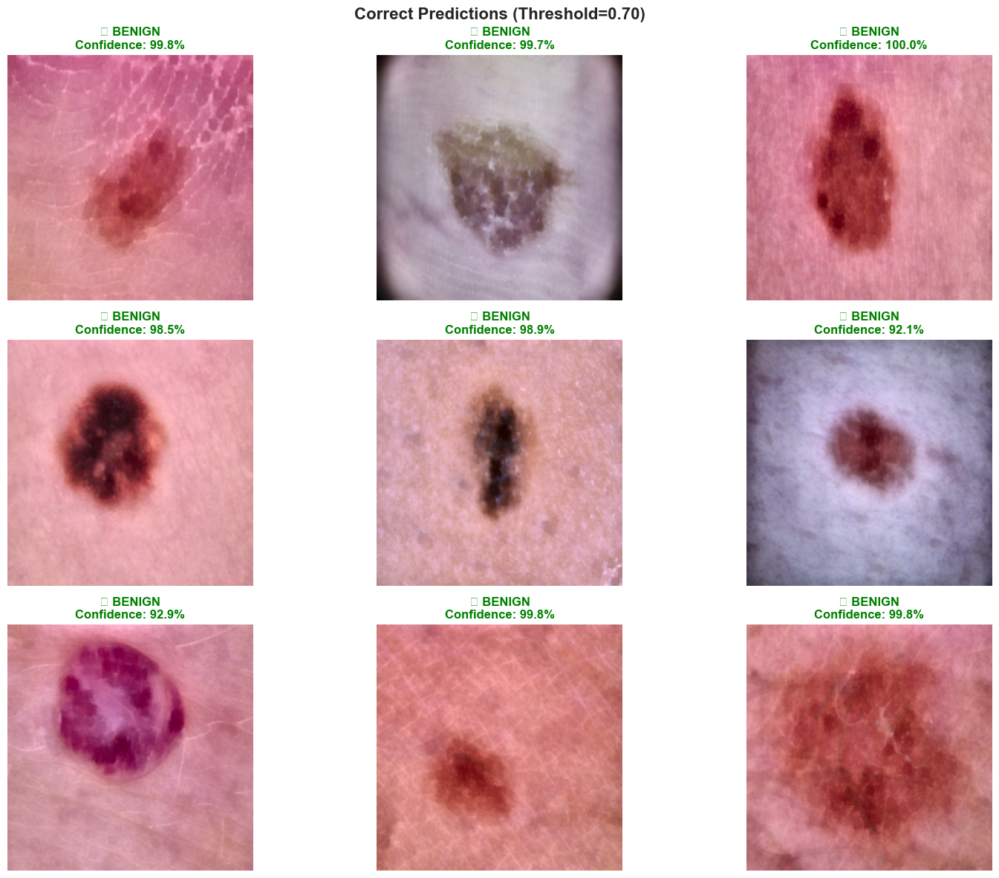


Incorrect Predictions:


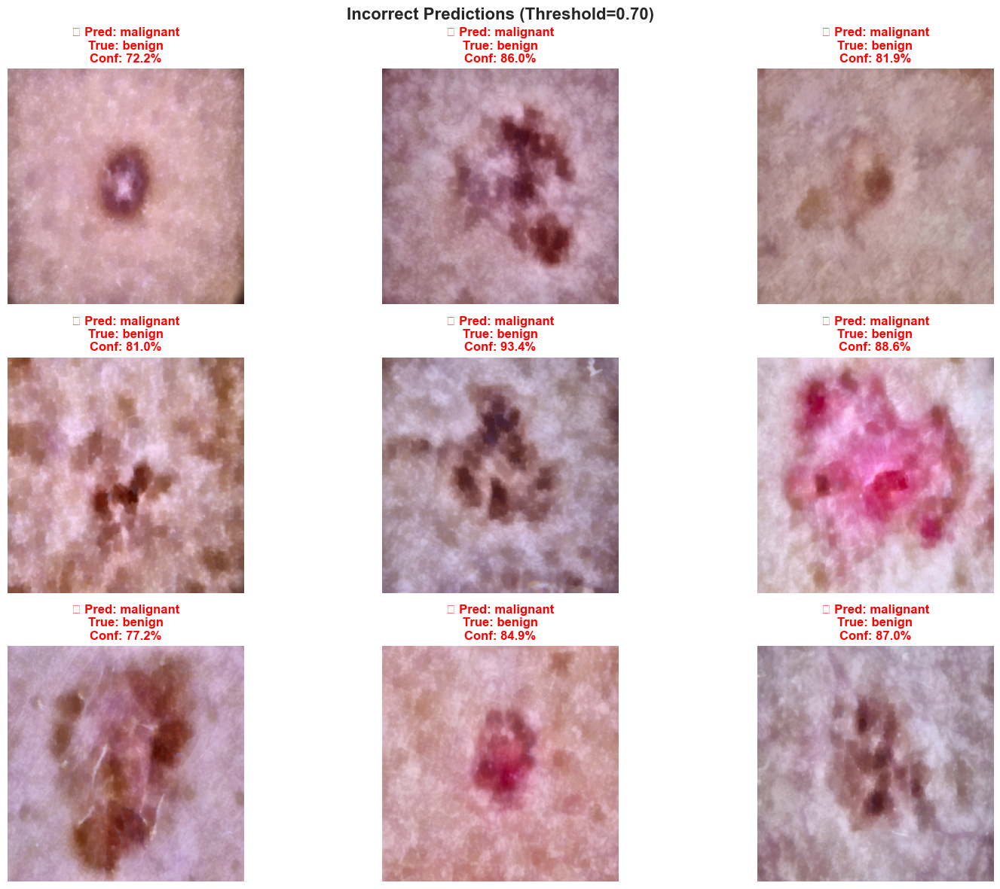

✓ Visualization complete
  Using ensemble of 2 models
  Threshold: 70%


In [39]:
def denormalize_image(img_tensor):
    """Denormalize image for visualization."""
    img = img_tensor.cpu().numpy().transpose(1, 2, 0)  # (C, H, W) -> (H, W, C)
    mean = np.array(IMAGENET_MEAN).reshape(1, 1, 3)  # Shape: (1, 1, 3)
    std = np.array(IMAGENET_STD).reshape(1, 1, 3)    # Shape: (1, 1, 3)
    img = std * img + mean  # Denormalize
    img = np.clip(img, 0, 1)
    return img

def visualize_predictions(models, test_loader, num_images=12, show_incorrect=False, threshold=0.40):
    """
    Visualize model predictions.
    
    Args:
        models: Single model or list of models (for ensemble)
        test_loader: DataLoader for test data
        num_images: Number of images to display
        show_incorrect: If True, show only incorrect predictions; if False, show only correct
        threshold: Probability threshold for malignant classification
    """
    # Handle both single model and ensemble
    if not isinstance(models, list):
        models = [models]
    
    # Set all models to eval mode
    for model in models:
        model.eval()
    
    images_shown = 0
    fig, axes = plt.subplots(3, 3, figsize=(16, 12))
    axes = axes.ravel()
    
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            
            # Get predictions from all models and average
            all_probs = []
            for model in models:
                outputs = model(images)
                probs = torch.softmax(outputs, dim=1)
                all_probs.append(probs)
            
            # Average across all models (ensemble prediction)
            avg_probs = torch.stack(all_probs).mean(dim=0)
            malignant_probs = avg_probs[:, 1]  # Get malignant class probability
            preds = (malignant_probs >= threshold).long()
            
            for i in range(len(images)):
                if images_shown >= num_images:
                    break
                
                is_correct = (preds[i] == labels[i]).item()
                
                # Calculate confidence in predicted class
                malignant_prob = malignant_probs[i].item()
                if preds[i].item() == 1:  # Predicted malignant
                    pred_confidence = malignant_prob
                else:  # Predicted benign
                    pred_confidence = 1 - malignant_prob
                
                # Filter based on confidence threshold
                if pred_confidence < threshold:
                    continue
                
                # Filter based on correctness
                if show_incorrect and is_correct:
                    continue
                if not show_incorrect and not is_correct:
                    continue
                
                # Denormalize and show image
                img = denormalize_image(images[i])
                axes[images_shown].imshow(img)
                
                # Create title
                true_label = idx_to_class[labels[i].item()]
                pred_label = idx_to_class[preds[i].item()]
                
                # FIXED: Show confidence in the predicted class
                malignant_prob = malignant_probs[i].item()
                if preds[i].item() == 1:  # Predicted malignant
                    confidence = malignant_prob * 100
                else:  # Predicted benign
                    confidence = (1 - malignant_prob) * 100
                
                if is_correct:
                    color = 'green'
                    title = f'✓ {pred_label.upper()}\nConfidence: {confidence:.1f}%'
                else:
                    color = 'red'
                    title = f'✗ Pred: {pred_label}\nTrue: {true_label}\nConf: {confidence:.1f}%'
                
                axes[images_shown].set_title(title, color=color, fontweight='bold')
                axes[images_shown].axis('off')
                
                images_shown += 1
            
            if images_shown >= num_images:
                break
    
    # Hide unused subplots
    for idx in range(images_shown, len(axes)):
        axes[idx].axis('off')
    
    status = 'Incorrect' if show_incorrect else 'Correct'
    plt.suptitle(f'{status} Predictions (Threshold={threshold:.2f})', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# ============================================================
# VISUALIZE ENSEMBLE PREDICTIONS
# ============================================================

print("="*80)
print("VISUALIZING ENSEMBLE PREDICTIONS")
print("="*80)

# Show correct predictions
print('\nCorrect Predictions:')
visualize_predictions(ensemble_models, test_loader, num_images=9, show_incorrect=False, threshold=OPTIMAL_ENSEMBLE_THRESHOLD)

# Show incorrect predictions
print('\nIncorrect Predictions:')
visualize_predictions(ensemble_models, test_loader, num_images=9, show_incorrect=True, threshold=OPTIMAL_ENSEMBLE_THRESHOLD)

print("="*80)
print("✓ Visualization complete")
print(f"  Using ensemble of {len(ensemble_models)} models")
print(f"  Threshold: {OPTIMAL_ENSEMBLE_THRESHOLD:.0%}")
print("="*80)


Grad-CAM

GRAD-CAM VISUALIZATION (Using Ensemble Predictions)

Getting ensemble predictions from 2 models...
✓ Got ensemble predictions

Generating Grad-CAM using best single model...
Note: Grad-CAM uses best single model (seed 123)
      But predictions shown are from ensemble

Generating Grad-CAM visualizations...


  0%|          | 0/9 [00:00<?, ?it/s]

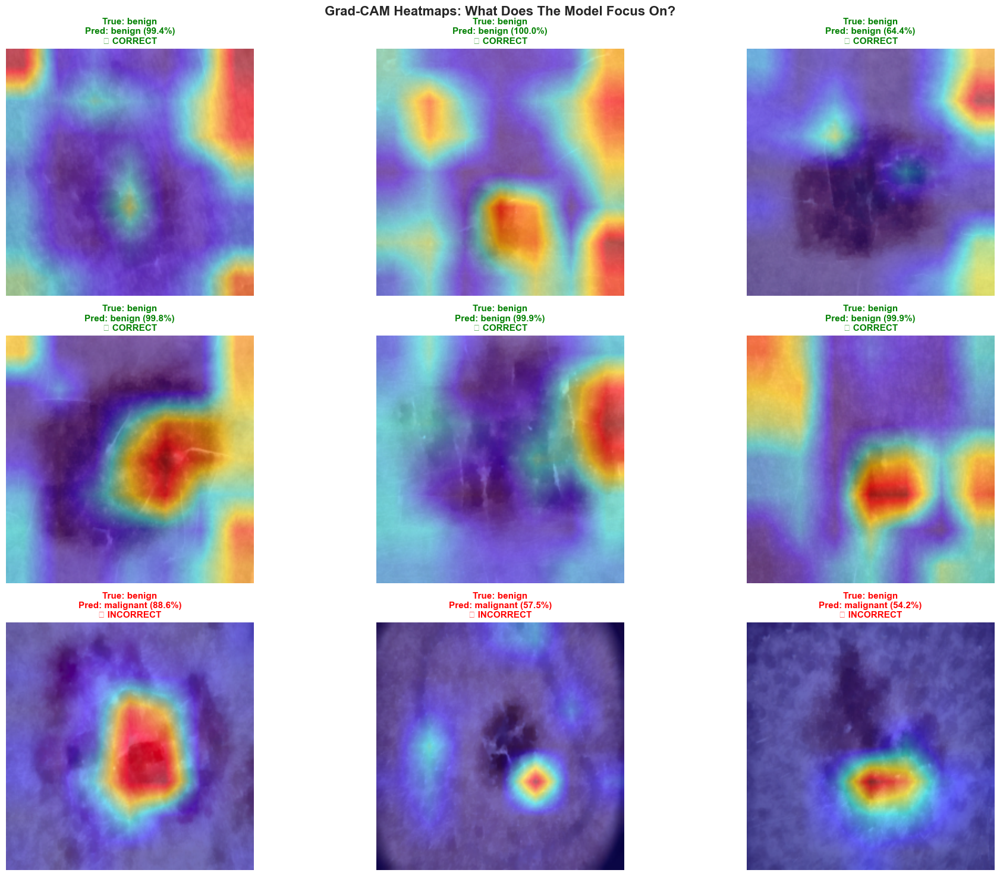


✓ Grad-CAM visualization complete

💡 Red areas = High importance for prediction
   Look for: Model focusing on lesion vs background/artifacts

INTERPRETATION GUIDE

✅ GOOD: Red heatmap concentrated on the lesion itself
⚠️  WARNING: Red areas on hair, rulers, skin marks (spurious correlations)
❌ BAD: Red areas on corners/background (model confused)

If the model focuses on the lesion: High confidence in deployment!
If the model focuses on artifacts: Need more data augmentation or cleaning.



In [41]:
# ============================================================
# GRAD-CAM VISUALIZATION - See What The Model Looks At
# ============================================================

from pytorch_grad_cam import GradCAM, HiResCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

def denormalize_for_gradcam(img_tensor):
    """Denormalize image for Grad-CAM visualization."""
    img = img_tensor.cpu().numpy()
    # Denormalize
    mean = np.array(IMAGENET_MEAN).reshape(3, 1, 1)
    std = np.array(IMAGENET_STD).reshape(3, 1, 1)
    img = img * std + mean
    img = np.clip(img, 0, 1)
    img = np.transpose(img, (1, 2, 0))
    return img


def visualize_gradcam(model, images, labels, predictions, probs, num_samples=12):
    """
    Visualize Grad-CAM heatmaps showing what the model focuses on.
    """
    model.eval()
    
    # Setup Grad-CAM
    target_layers = [model.features[-1]]  # Last convolutional layer
    cam = GradCAM(model=model, target_layers=target_layers)
    
    # Select interesting samples: some correct, some incorrect
    correct_indices = np.where(predictions == labels)[0]
    incorrect_indices = np.where(predictions != labels)[0]
    
    # Get a mix
    selected_correct = np.random.choice(correct_indices, min(6, len(correct_indices)), replace=False)
    selected_incorrect = np.random.choice(incorrect_indices, min(6, len(incorrect_indices)), replace=False)
    selected_indices = np.concatenate([selected_correct, selected_incorrect])[:num_samples]
    
    fig, axes = plt.subplots(3, 3, figsize=(20, 15))
    axes = axes.flatten()
    
    print("Generating Grad-CAM visualizations...")
    
    for idx, sample_idx in enumerate(tqdm(selected_indices)):
        img_tensor = images[sample_idx].unsqueeze(0).to(device)
        true_label = labels[sample_idx]
        pred_label = predictions[sample_idx]
        confidence = probs[sample_idx][pred_label]
        
        # Get Grad-CAM for predicted class
        targets = [ClassifierOutputTarget(pred_label)]
        
        # Generate CAM
        grayscale_cam = cam(input_tensor=img_tensor, targets=targets)
        grayscale_cam = grayscale_cam[0, :]
        
        # Denormalize image for visualization
        img_display = denormalize_for_gradcam(images[sample_idx])
        
        # Overlay CAM on image
        visualization = show_cam_on_image(img_display, grayscale_cam, use_rgb=True)
        
        # Display
        axes[idx].imshow(visualization)
        
        # Title with prediction info
        true_class = CLASS_NAMES[true_label]
        pred_class = CLASS_NAMES[pred_label]
        is_correct = true_label == pred_label
        
        color = 'green' if is_correct else 'red'
        title = f'True: {true_class}\nPred: {pred_class} ({confidence:.1%})'
        if is_correct:
            title += '\n✓ CORRECT'
        else:
            title += '\n✗ INCORRECT'
        
        axes[idx].set_title(title, fontsize=11, fontweight='bold', color=color)
        axes[idx].axis('off')
    
    plt.suptitle('Grad-CAM Heatmaps: What Does The Model Focus On?', 
                 fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.show()
    
    print("\n✓ Grad-CAM visualization complete")
    print("\n💡 Red areas = High importance for prediction")
    print("   Look for: Model focusing on lesion vs background/artifacts")


# ============================================================
# GET SAMPLES AND ENSEMBLE PREDICTIONS
# ============================================================

# Get a batch of images for visualization
sample_images = []
sample_labels = []

for i, (images_batch, labels_batch) in enumerate(test_loader):
    sample_images.append(images_batch)
    sample_labels.append(labels_batch)
    if len(sample_images) * test_loader.batch_size >= 200:
        break

sample_images = torch.cat(sample_images, dim=0)[:200]
sample_labels = torch.cat(sample_labels, dim=0)[:200]

# Get ENSEMBLE predictions for these samples
print("="*80)
print("GRAD-CAM VISUALIZATION (Using Ensemble Predictions)")
print("="*80)
print(f"\nGetting ensemble predictions from {len(ensemble_models)} models...")

all_model_probs = []
for model in ensemble_models:
    model.eval()
    with torch.no_grad():
        outputs = model(sample_images.to(device))
        probs = torch.softmax(outputs, dim=1).cpu().numpy()
        all_model_probs.append(probs)

# Average predictions across ensemble
ensemble_probs = np.mean(all_model_probs, axis=0)
ensemble_predictions = ensemble_probs.argmax(axis=1)

print(f"✓ Got ensemble predictions")
print(f"\nGenerating Grad-CAM using best single model...")

# Load best single model for Grad-CAM (load it)
best_model = SimpleEfficientNet(num_classes=2, pretrained=False)
checkpoint = torch.load('best_melanoma_single.pth')
best_model.load_state_dict(checkpoint['model_state_dict'])
best_model = best_model.to(device)
best_model.eval()

# Get seed from checkpoint if available
model_seed = checkpoint.get('seed', 'unknown')
print(f"Note: Grad-CAM uses best single model (seed {model_seed})")
print(f"      But predictions shown are from ensemble\n")

# Visualize using best model + ensemble predictions
visualize_gradcam(
    best_model, 
    sample_images, 
    sample_labels.numpy(), 
    ensemble_predictions, 
    ensemble_probs,
    num_samples=9
)

print("\n" + "="*80)
print("INTERPRETATION GUIDE")
print("="*80)
print("""
✅ GOOD: Red heatmap concentrated on the lesion itself
⚠️  WARNING: Red areas on hair, rulers, skin marks (spurious correlations)
❌ BAD: Red areas on corners/background (model confused)

If the model focuses on the lesion: High confidence in deployment!
If the model focuses on artifacts: Need more data augmentation or cleaning.
""")


DETAILED GRAD-CAM ANALYSIS (Using Ensemble Predictions)

Note: Grad-CAM heatmaps from best single model (seed 123)
      Predictions are from ensemble of 2 models

Generating detailed Grad-CAM analysis...


  0%|          | 0/4 [00:00<?, ?it/s]

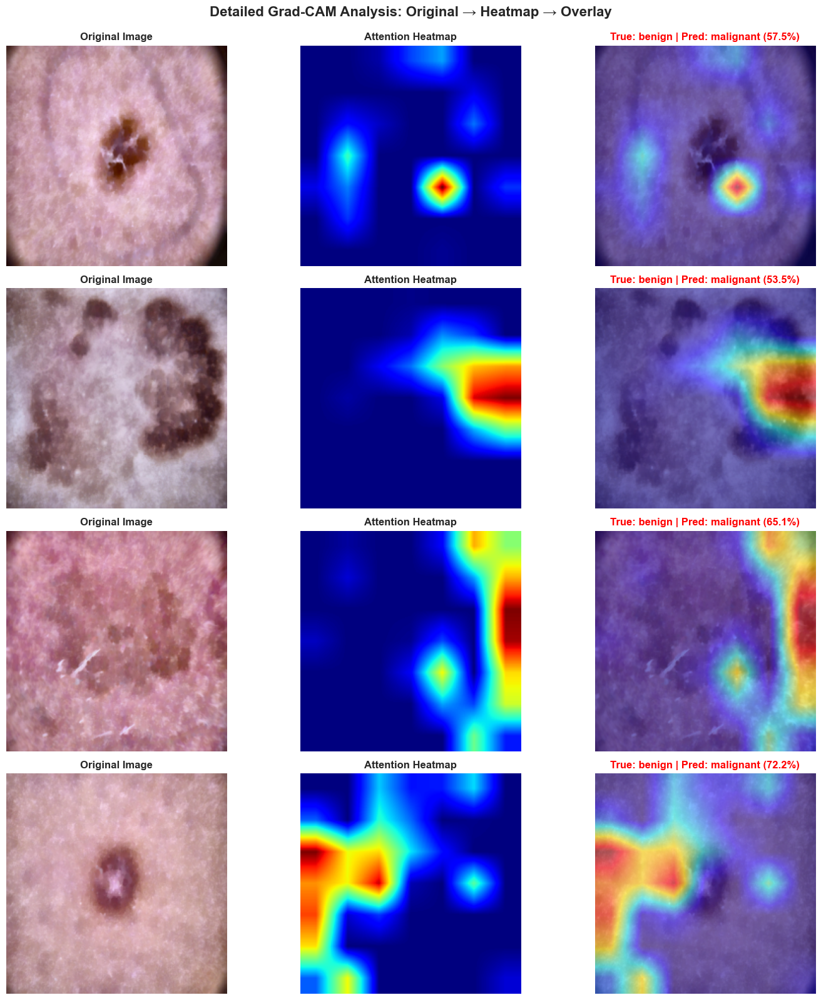


✓ Detailed Grad-CAM analysis complete


In [43]:
# ============================================================
# SIDE-BY-SIDE: ORIGINAL vs GRAD-CAM OVERLAY
# ============================================================

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

def visualize_side_by_side_gradcam(model, images, labels, predictions, probs, num_samples=8):
    """
    Show original image next to Grad-CAM overlay.
    """
    model.eval()
    target_layers = [model.features[-1]]
    cam = GradCAM(model=model, target_layers=target_layers)
    
    # Select samples
    incorrect_indices = np.where(predictions != labels)[0]
    high_conf_correct = np.where((predictions == labels) & (probs.max(axis=1) > 0.9))[0]
    
    selected = np.concatenate([
        incorrect_indices[:4] if len(incorrect_indices) >= 4 else incorrect_indices,
        high_conf_correct[:4] if len(high_conf_correct) >= 4 else high_conf_correct
    ])[:num_samples]
    
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 4*num_samples))
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    print("Generating detailed Grad-CAM analysis...")
    
    for idx, sample_idx in enumerate(tqdm(selected)):
        img_tensor = images[sample_idx].unsqueeze(0).to(device)
        true_label = labels[sample_idx]
        pred_label = predictions[sample_idx]
        confidence = probs[sample_idx][pred_label]
        
        targets = [ClassifierOutputTarget(pred_label)]
        grayscale_cam = cam(input_tensor=img_tensor, targets=targets)[0, :]
        img_display = denormalize_for_gradcam(images[sample_idx])
        
        # 1. Original image
        axes[idx, 0].imshow(img_display)
        axes[idx, 0].set_title('Original Image', fontsize=12, fontweight='bold')
        axes[idx, 0].axis('off')
        
        # 2. Heatmap only
        axes[idx, 1].imshow(grayscale_cam, cmap='jet')
        axes[idx, 1].set_title('Attention Heatmap', fontsize=12, fontweight='bold')
        axes[idx, 1].axis('off')
        
        # 3. Overlay
        visualization = show_cam_on_image(img_display, grayscale_cam, use_rgb=True)
        axes[idx, 2].imshow(visualization)
        
        true_class = CLASS_NAMES[true_label]
        pred_class = CLASS_NAMES[pred_label]
        is_correct = true_label == pred_label
        color = 'green' if is_correct else 'red'
        
        title = f'True: {true_class} | Pred: {pred_class} ({confidence:.1%})'
        axes[idx, 2].set_title(title, fontsize=12, fontweight='bold', color=color)
        axes[idx, 2].axis('off')
    
    plt.suptitle('Detailed Grad-CAM Analysis: Original → Heatmap → Overlay', 
                 fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.savefig('images/gradcam_analysis.png')
    plt.show()


# ============================================================
# RUN SIDE-BY-SIDE VISUALIZATION WITH ENSEMBLE
# ============================================================

print("\n" + "="*80)
print("DETAILED GRAD-CAM ANALYSIS (Using Ensemble Predictions)")
print("="*80)

# Load best single model
best_model_gradcam = SimpleEfficientNet(num_classes=2, pretrained=False)
checkpoint = torch.load('best_melanoma_single.pth')
best_model_gradcam.load_state_dict(checkpoint['model_state_dict'])
best_model_gradcam = best_model_gradcam.to(device)
best_model_gradcam.eval()

model_seed = checkpoint.get('seed', 'unknown')

print(f"\nNote: Grad-CAM heatmaps from best single model (seed {model_seed})")
print(f"      Predictions are from ensemble of {len(ensemble_models)} models\n")

visualize_side_by_side_gradcam(
    best_model_gradcam,  # Use best single model for Grad-CAM
    sample_images,
    sample_labels.numpy(),
    ensemble_predictions,  # Use ensemble predictions
    ensemble_probs,  # Use ensemble probabilities
    num_samples=4
)

print("\n" + "="*80)
print("✓ Detailed Grad-CAM analysis complete")
print("="*80)